In [1]:
import numpy as np
import pandas as pd
import re
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats

### 21/12/23


In [2]:
rack1_1 = pd.read_csv('./dscpdata/macpherson_1_21_12_23.csv')

In [3]:
rack1_1.head()

,Timestamp,Number of Worms (non-counted),Phosphorous01,Phosphorous02,Nitrogen01,Nitrogen02,Potassium01,Potassium02,Light Intensity,Temp01,Hum01,Heat01,SoilM01,SoilM02,Grams of Compost Harvested,Buzzer (NIL),Unnamed: 16
0,"22 Dec 2023, 10:00 AM",20,160,150,120,150,100,94,NaN,28.5,NaN,NaN,1.0,1.0,NaN,NaN,NaN
1,"22 Dec 2023, 10:01 AM",20,160,150,120,150,100,94,NaN,28.5,NaN,NaN,1.0,1.0,NaN,NaN,NaN
2,"22 Dec 2023, 10:02 AM",20,160,150,120,150,100,94,NaN,28.5,NaN,NaN,1.0,1.0,NaN,NaN,NaN
3,"22 Dec 2023, 10:03 AM",20,160,150,120,150,100,94,NaN,28.5,NaN,NaN,1.0,1.0,NaN,NaN,NaN
4,"22 Dec 2023, 10:04 AM",20,160,150,120,150,100,94,NaN,28.5,NaN,NaN,1.0,1.0,NaN,NaN,NaN


In [4]:
rack1_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 809 entries, 0 to 808
Data columns (total 17 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Timestamp                      809 non-null    object 
 1   Number of Worms (non-counted)  809 non-null    int64  
 2   Phosphorous01                  809 non-null    object 
 3   Phosphorous02                  809 non-null    object 
 4   Nitrogen01                     809 non-null    object 
 5   Nitrogen02                     809 non-null    object 
 6   Potassium01                    809 non-null    object 
 7   Potassium02                    809 non-null    object 
 8   Light Intensity                0 non-null      float64
 9   Temp01                         437 non-null    float64
 10  Hum01                          0 non-null      float64
 11  Heat01                         0 non-null      float64
 12  SoilM01                        553 non-null    flo

In [5]:
rack1_1.describe()

,Number of Worms (non-counted),Light Intensity,Temp01,Hum01,Heat01,SoilM01,SoilM02,Grams of Compost Harvested,Buzzer (NIL)
count,809.0,0.0,437.000000,0.0,0.0,553.000000,553.000000,0.0,0.0
mean,20.0,NaN,27.713501,NaN,NaN,0.811935,0.998192,NaN,NaN
std,0.0,NaN,0.392797,NaN,NaN,0.391118,0.042524,NaN,NaN
min,20.0,NaN,27.300000,NaN,NaN,0.000000,0.000000,NaN,NaN
25%,20.0,NaN,27.500000,NaN,NaN,1.000000,1.000000,NaN,NaN
50%,20.0,NaN,27.500000,NaN,NaN,1.000000,1.000000,NaN,NaN
75%,20.0,NaN,27.700000,NaN,NaN,1.000000,1.000000,NaN,NaN
max,20.0,NaN,28.500000,NaN,NaN,1.000000,1.000000,NaN,NaN


In [6]:
for column in ['Phosphorous01', 'Phosphorous02', 'Nitrogen01', 'Nitrogen02', 'Potassium01', 'Potassium02']:
    rack1_1[column] = pd.to_numeric(rack1_1[column], errors='coerce') 
    rack1_1[column] = rack1_1[column].fillna(0)  
    rack1_1[column] = rack1_1[column].astype(int)  

rack1_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 809 entries, 0 to 808
Data columns (total 17 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Timestamp                      809 non-null    object 
 1   Number of Worms (non-counted)  809 non-null    int64  
 2   Phosphorous01                  809 non-null    int32  
 3   Phosphorous02                  809 non-null    int32  
 4   Nitrogen01                     809 non-null    int32  
 5   Nitrogen02                     809 non-null    int32  
 6   Potassium01                    809 non-null    int32  
 7   Potassium02                    809 non-null    int32  
 8   Light Intensity                0 non-null      float64
 9   Temp01                         437 non-null    float64
 10  Hum01                          0 non-null      float64
 11  Heat01                         0 non-null      float64
 12  SoilM01                        553 non-null    flo

In [7]:
rack1_1['Timestamp'] = pd.to_datetime(rack1_1['Timestamp'])

In [ ]:
color = []
missing_counts = rack1_1.isnull().sum()

plt.figure(figsize=(10, 6))  # Set the figure size

missing_counts.plot(kind='bar')


plt.title('Number of Missing Data by Variable')  # Set the title
plt.xlabel('Variables')  # Set the x-axis label
plt.ylabel('Number of Missing Data')  # Set the y-axis label

plt.show()

### Trend over time

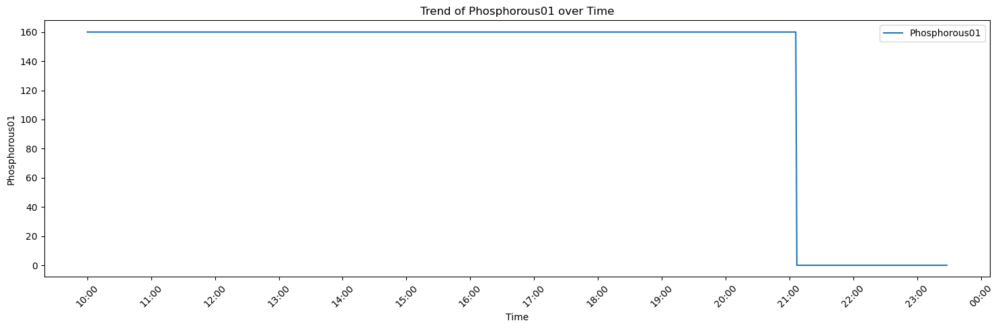

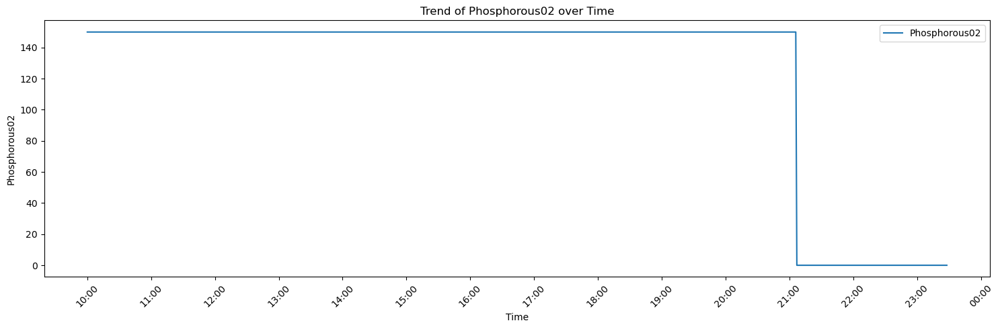

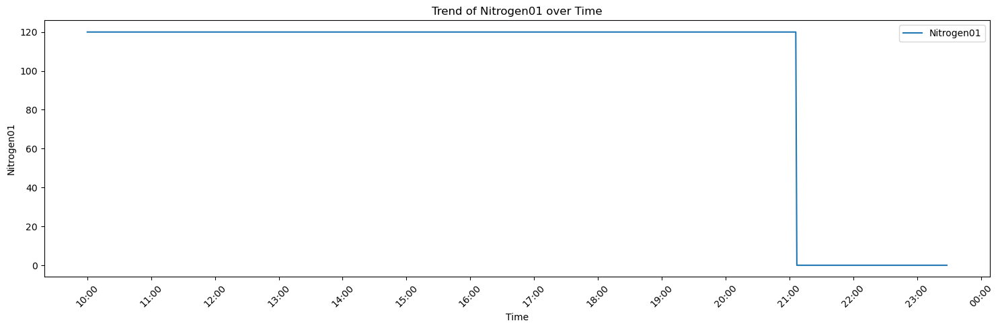

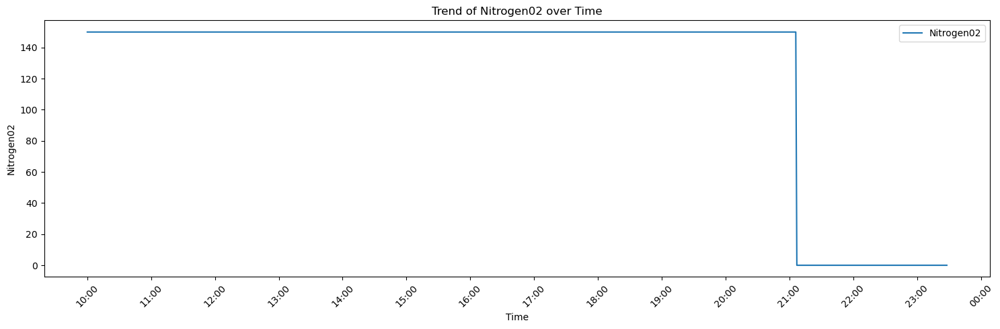

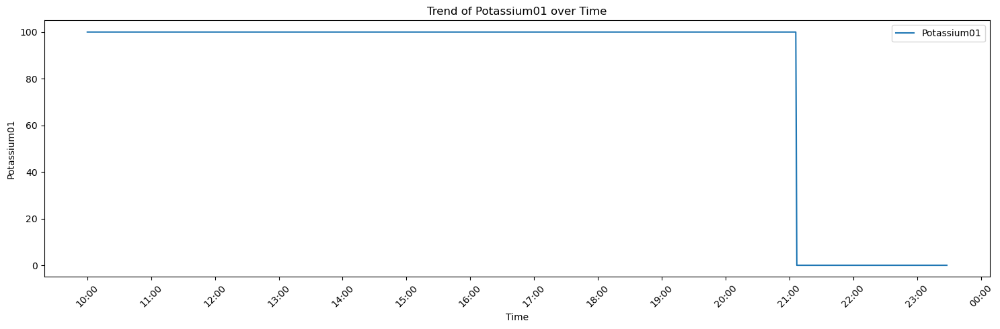

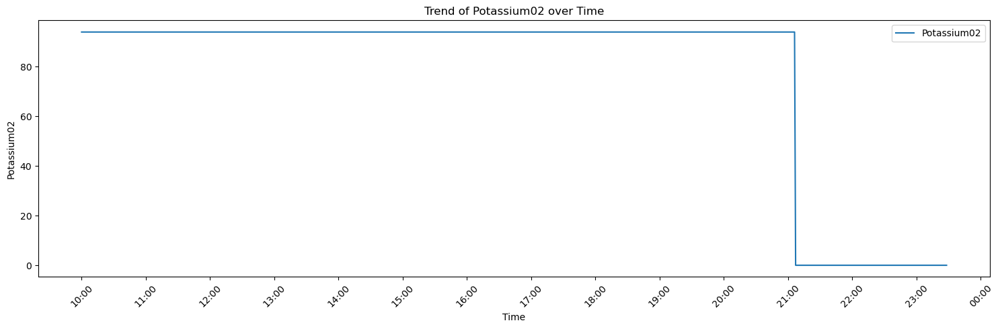

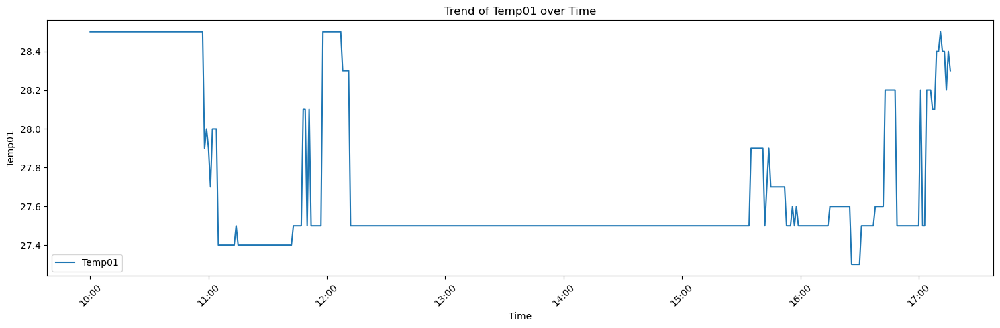

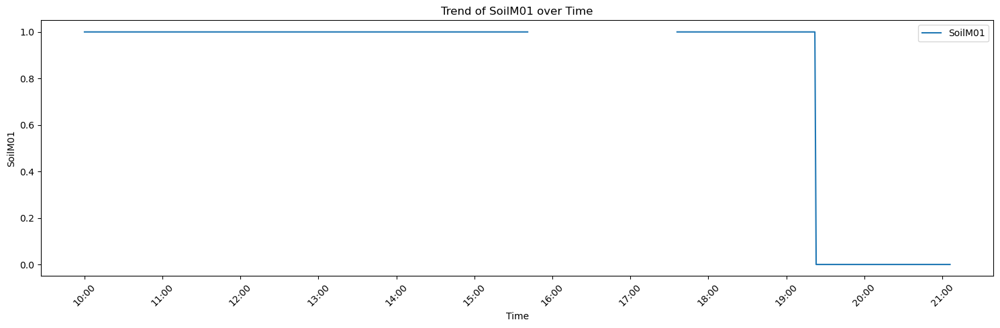

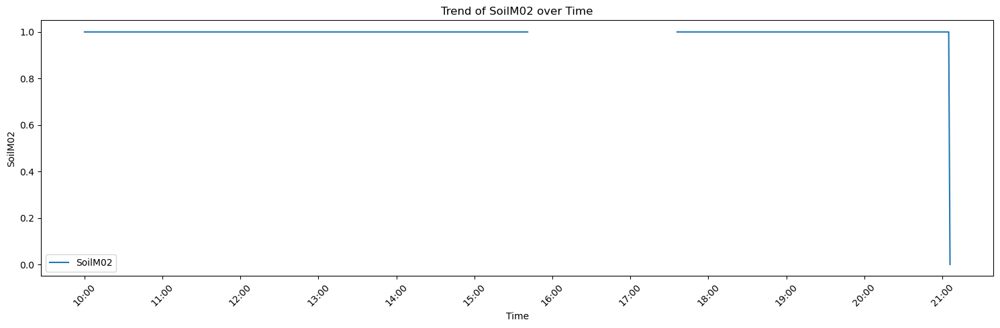

In [8]:
import matplotlib.dates as mdates
variables_to_plot = ['Phosphorous01', 'Phosphorous02', 'Nitrogen01', 'Nitrogen02', 
                     'Potassium01', 'Potassium02', 'Temp01', 'SoilM01', 'SoilM02',
                    ]

for variable in variables_to_plot:
    plt.figure(figsize=(15, 5))
    plt.plot(rack1_1['Timestamp'], rack1_1[variable], label=variable)
    plt.title(f'Trend of {variable} over Time')
    plt.xlabel('Time')
    plt.ylabel(variable)

    # Configure x-axis with time formatting
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.HourLocator(interval=1))  # Locate hours every hour
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))  # Show only hours and minutes

    plt.xticks(rotation=45)  # Rotate for better readability
    plt.legend()
    plt.tight_layout()  # Adjust layout to fit everything
    plt.show()


### NPK RATIO

In [9]:

# Convert the 'Phosphorous', 'Nitrogen', and 'Potassium' columns to numeric, coercing errors to NaN
rack1_1['Phosphorous01'] = pd.to_numeric(rack1_1['Phosphorous01'], errors='coerce')
rack1_1['Phosphorous02'] = pd.to_numeric(rack1_1['Phosphorous02'], errors='coerce')
rack1_1['Nitrogen01'] = pd.to_numeric(rack1_1['Nitrogen01'], errors='coerce')
rack1_1['Nitrogen02'] = pd.to_numeric(rack1_1['Nitrogen02'], errors='coerce')
rack1_1['Potassium01'] = pd.to_numeric(rack1_1['Potassium01'], errors='coerce')
rack1_1['Potassium02'] = pd.to_numeric(rack1_1['Potassium02'], errors='coerce')

# Calculate the sum of the averaged readings for N, P, and K
rack1_1['Sum_NPK_Avg'] = ((rack1_1['Nitrogen01'] + rack1_1['Nitrogen02']) / 2) + \
                         ((rack1_1['Phosphorous01'] + rack1_1['Phosphorous02']) / 2) + \
                         ((rack1_1['Potassium01'] + rack1_1['Potassium02']) / 2)

# Calculate the percentage of N, P, and K relative to the sum of the averaged readings
rack1_1['N_Percentage'] = ((rack1_1['Nitrogen01'] + rack1_1['Nitrogen02']) / 2) / rack1_1['Sum_NPK_Avg'] * 100
rack1_1['P_Percentage'] = ((rack1_1['Phosphorous01'] + rack1_1['Phosphorous02']) / 2) / rack1_1['Sum_NPK_Avg'] * 100
rack1_1['K_Percentage'] = ((rack1_1['Potassium01'] + rack1_1['Potassium02']) / 2) / rack1_1['Sum_NPK_Avg'] * 100

# Check the new variables by displaying the first few rows
print(rack1_1[['N_Percentage', 'P_Percentage', 'K_Percentage']].head())

   N_Percentage  P_Percentage  K_Percentage
0     34.883721      40.05168     25.064599
1     34.883721      40.05168     25.064599
2     34.883721      40.05168     25.064599
3     34.883721      40.05168     25.064599
4     34.883721      40.05168     25.064599


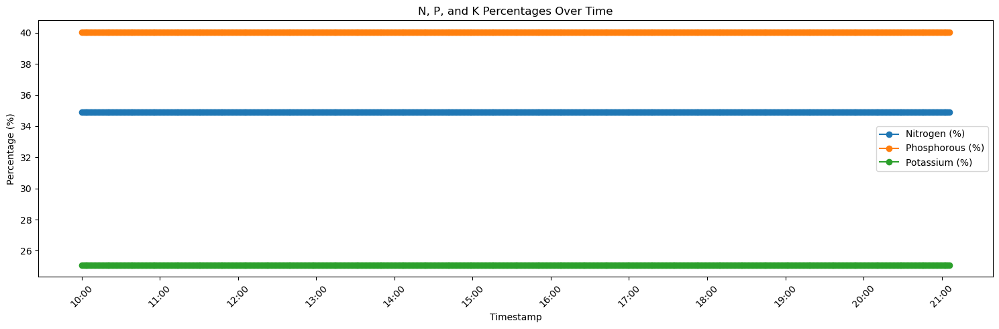

In [10]:

plt.figure(figsize=(15, 5))

# Plot each nutrient's percentage
plt.plot(rack1_1['Timestamp'], rack1_1['N_Percentage'], label='Nitrogen (%)', marker='o')
plt.plot(rack1_1['Timestamp'], rack1_1['P_Percentage'], label='Phosphorous (%)', marker='o')
plt.plot(rack1_1['Timestamp'], rack1_1['K_Percentage'], label='Potassium (%)', marker='o')

# Adding labels and title
plt.title('N, P, and K Percentages Over Time')
plt.xlabel('Timestamp')
plt.ylabel('Percentage (%)')

# Rotate the x-axis labels to prevent overlap
plt.xticks(rotation=45)

ax = plt.gca()  # Get current axes
ax.xaxis.set_major_locator(mdates.HourLocator(interval=1))  # Locate hours every hour
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))  # Show only hours and minutes
# Adding a legend to distinguish between lines
plt.legend()

# Adjust the layout
plt.tight_layout()

# Display the plot
plt.show()

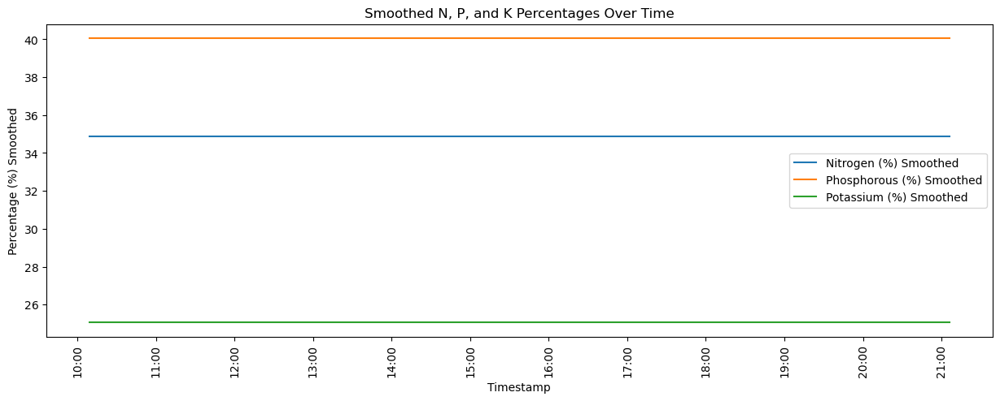

In [11]:
# Calculate rolling averages for a smoother plot
window_size = 10  # for example, a window of 10 data points
rack1_1['N_Percentage_Smooth'] = rack1_1['N_Percentage'].rolling(window=window_size).mean()
rack1_1['P_Percentage_Smooth'] = rack1_1['P_Percentage'].rolling(window=window_size).mean()
rack1_1['K_Percentage_Smooth'] = rack1_1['K_Percentage'].rolling(window=window_size).mean()

plt.figure(figsize=(15, 5))
plt.plot(rack1_1['Timestamp'], rack1_1['N_Percentage_Smooth'], label='Nitrogen (%) Smoothed')
plt.plot(rack1_1['Timestamp'], rack1_1['P_Percentage_Smooth'], label='Phosphorous (%) Smoothed')
plt.plot(rack1_1['Timestamp'], rack1_1['K_Percentage_Smooth'], label='Potassium (%) Smoothed')
plt.title('Smoothed N, P, and K Percentages Over Time')
plt.xlabel('Timestamp')
plt.ylabel('Percentage (%) Smoothed')

ax = plt.gca()  # Get current axes
ax.xaxis.set_major_locator(mdates.HourLocator(interval=1))  # Locate hours every hour
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))  # Show only hours and minutes
plt.legend()
plt.xticks(rotation=90)  # May need to rotate the x-axis labels to vertical if still too cluttered
plt.show()


### 23/12/23

In [12]:
rack1_1 = pd.read_csv('./dscpdata/macpherson_1_23_12_23.csv')

In [13]:
rack1_1.head()

,Timestamp,Number of Worms (non-counted),Phosphorous01,Phosphorous02,Nitrogen01,Nitrogen02,Potassium01,Potassium02,Light Intensity,Temp01,Hum01,Heat01,SoilM01,SoilM02,Grams of Compost Harvested,Buzzer (NIL)
0,"23 Dec 2023, 10:00 AM",20,160,150,120,150,100,94,NaN,28.5,0.0,42.0,1.0,1.0,NaN,NaN
1,"23 Dec 2023, 10:01 AM",20,160,150,120,150,100,94,NaN,28.5,0.0,42.0,1.0,1.0,NaN,NaN
2,"23 Dec 2023, 10:02 AM",20,160,150,120,150,100,94,NaN,28.5,0.0,42.0,1.0,1.0,NaN,NaN
3,"23 Dec 2023, 10:03 AM",20,160,150,120,150,100,94,NaN,28.5,0.0,42.0,1.0,1.0,NaN,NaN
4,"23 Dec 2023, 10:04 AM",20,160,150,120,150,100,94,NaN,28.5,96.0,42.0,1.0,1.0,NaN,NaN


In [14]:
rack1_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 809 entries, 0 to 808
Data columns (total 16 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Timestamp                      809 non-null    object 
 1   Number of Worms (non-counted)  809 non-null    int64  
 2   Phosphorous01                  809 non-null    object 
 3   Phosphorous02                  809 non-null    object 
 4   Nitrogen01                     809 non-null    object 
 5   Nitrogen02                     809 non-null    object 
 6   Potassium01                    809 non-null    object 
 7   Potassium02                    809 non-null    object 
 8   Light Intensity                0 non-null      float64
 9   Temp01                         632 non-null    float64
 10  Hum01                          632 non-null    float64
 11  Heat01                         632 non-null    float64
 12  SoilM01                        553 non-null    flo

In [15]:
rack1_1.describe()

,Number of Worms (non-counted),Light Intensity,Temp01,Hum01,Heat01,SoilM01,SoilM02,Grams of Compost Harvested,Buzzer (NIL)
count,809.0,0.0,632.0,632.000000,632.000000,553.000000,553.000000,0.0,0.0
mean,20.0,NaN,28.5,72.406646,38.943038,0.811935,0.998192,NaN,NaN
std,0.0,NaN,0.0,41.032408,11.901601,0.391118,0.042524,NaN,NaN
min,20.0,NaN,28.5,0.000000,0.000000,0.000000,0.000000,NaN,NaN
25%,20.0,NaN,28.5,92.000000,42.000000,1.000000,1.000000,NaN,NaN
50%,20.0,NaN,28.5,95.000000,42.000000,1.000000,1.000000,NaN,NaN
75%,20.0,NaN,28.5,95.000000,43.000000,1.000000,1.000000,NaN,NaN
max,20.0,NaN,28.5,100.000000,49.000000,1.000000,1.000000,NaN,NaN


In [16]:
for column in ['Phosphorous01', 'Phosphorous02', 'Nitrogen01', 'Nitrogen02', 'Potassium01', 'Potassium02']:
    rack1_1[column] = pd.to_numeric(rack1_1[column], errors='coerce') 
    rack1_1[column] = rack1_1[column].fillna(0)  
    rack1_1[column] = rack1_1[column].astype(int)  

rack1_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 809 entries, 0 to 808
Data columns (total 16 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Timestamp                      809 non-null    object 
 1   Number of Worms (non-counted)  809 non-null    int64  
 2   Phosphorous01                  809 non-null    int32  
 3   Phosphorous02                  809 non-null    int32  
 4   Nitrogen01                     809 non-null    int32  
 5   Nitrogen02                     809 non-null    int32  
 6   Potassium01                    809 non-null    int32  
 7   Potassium02                    809 non-null    int32  
 8   Light Intensity                0 non-null      float64
 9   Temp01                         632 non-null    float64
 10  Hum01                          632 non-null    float64
 11  Heat01                         632 non-null    float64
 12  SoilM01                        553 non-null    flo

In [17]:
rack1_1['Timestamp'] = pd.to_datetime(rack1_1['Timestamp'])

In [ ]:
color = []
missing_counts = rack1_1.isnull().sum()

plt.figure(figsize=(10, 6))  # Set the figure size

missing_counts.plot(kind='bar')


plt.title('Number of Missing Data by Variable')  # Set the title
plt.xlabel('Variables')  # Set the x-axis label
plt.ylabel('Number of Missing Data')  # Set the y-axis label

plt.show()

### Trend over time

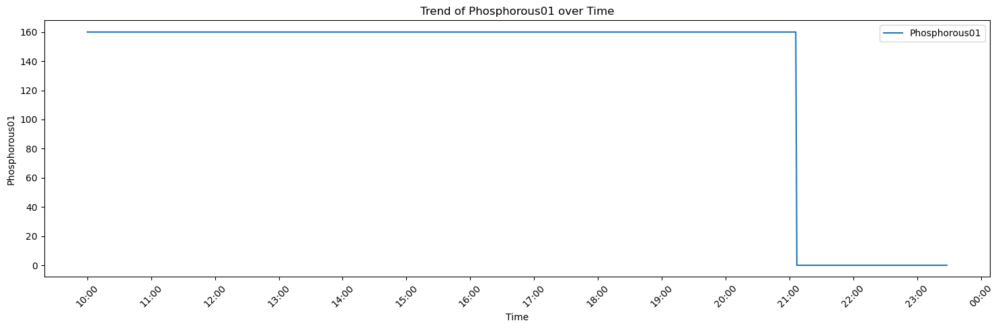

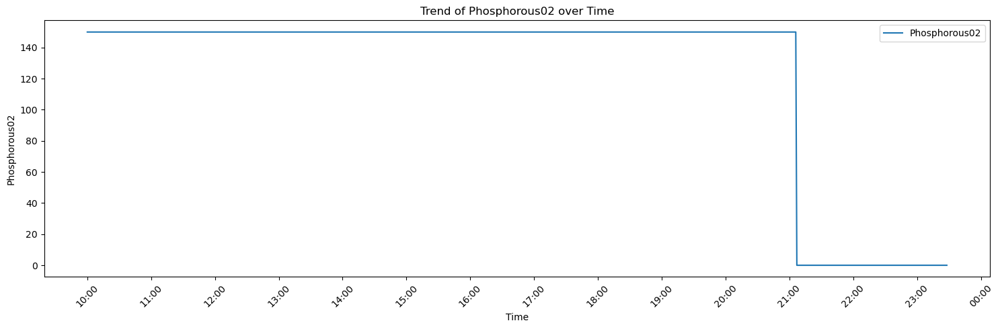

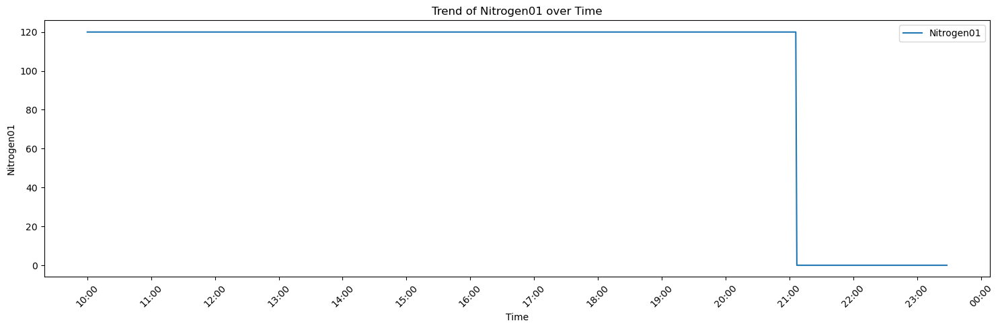

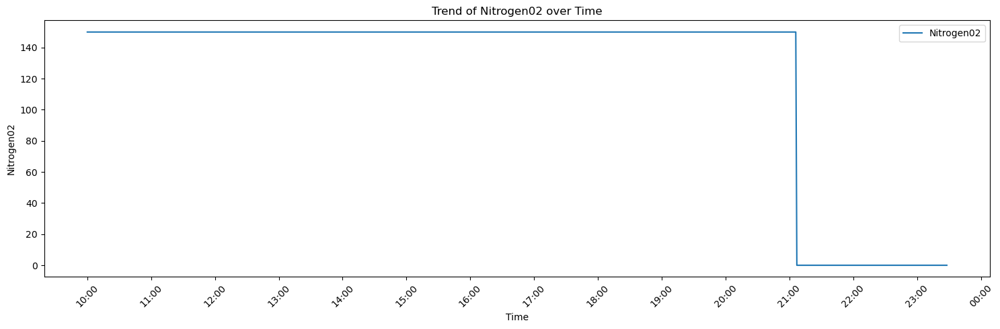

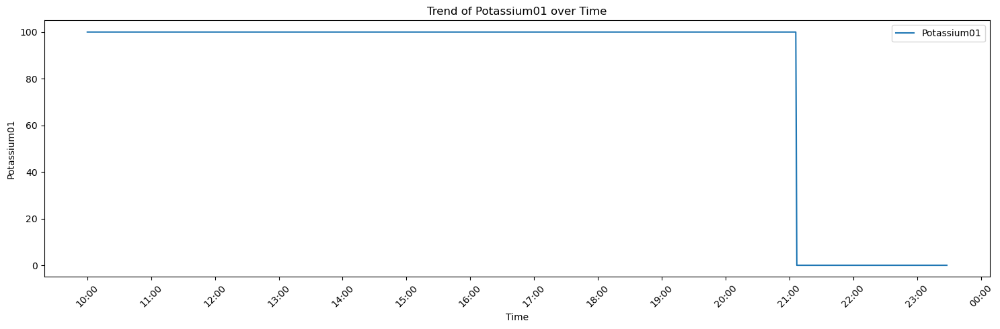

...

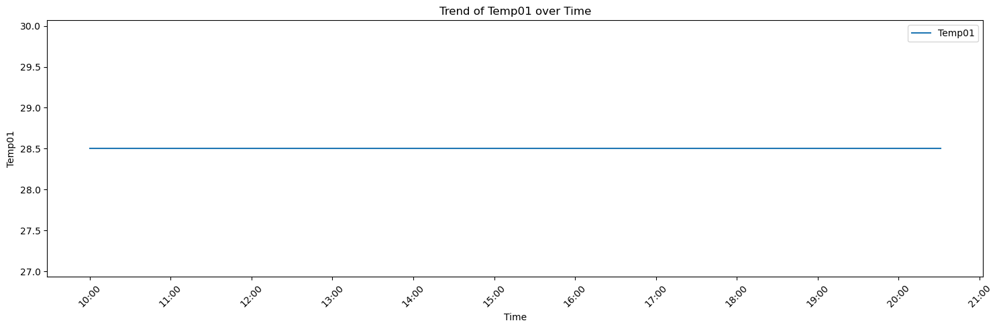

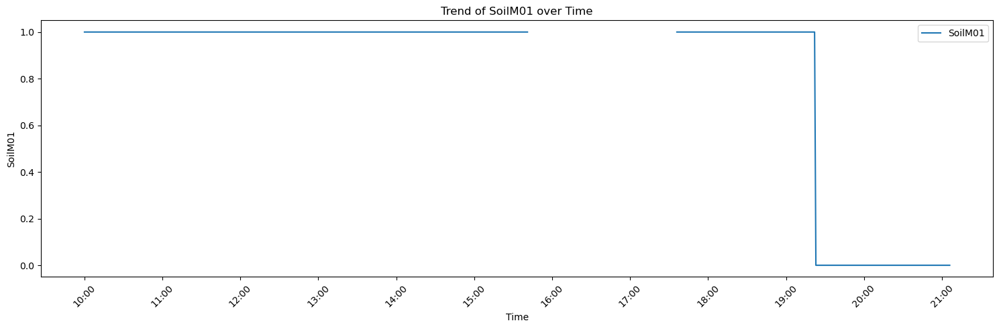

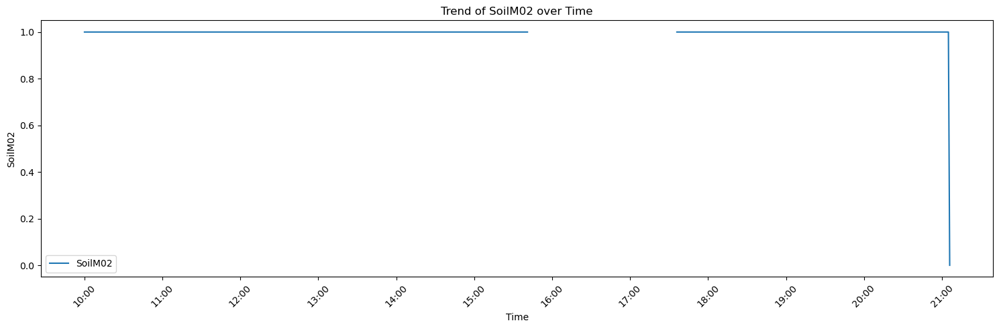

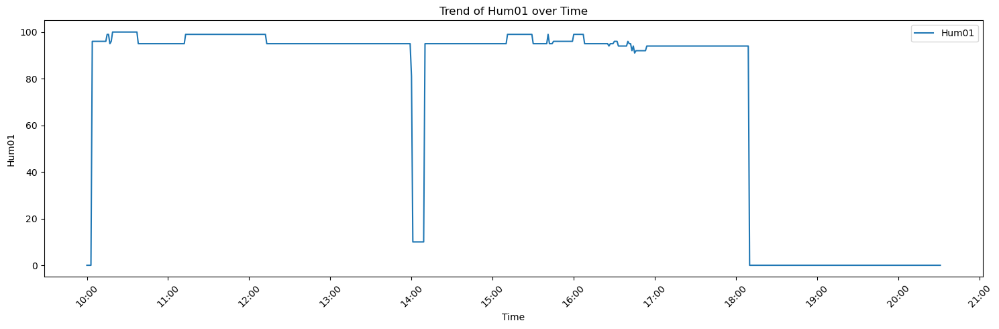

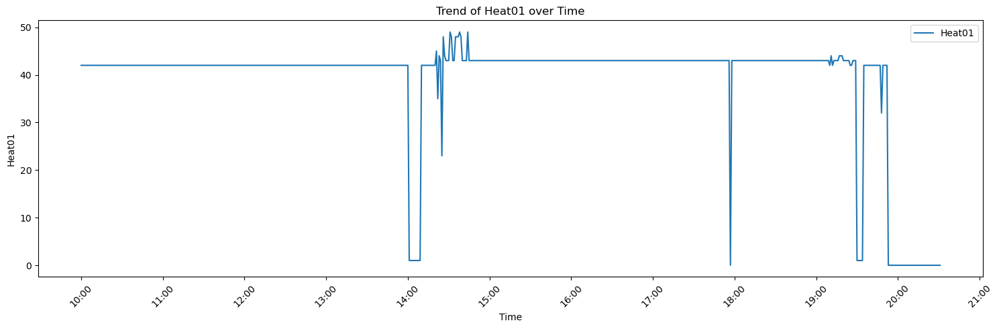

In [18]:

variables_to_plot = ['Phosphorous01', 'Phosphorous02', 'Nitrogen01', 'Nitrogen02', 
                     'Potassium01', 'Potassium02', 'Temp01', 'SoilM01', 'SoilM02',
                     'Hum01', 'Heat01']

for variable in variables_to_plot:
    plt.figure(figsize=(15, 5))
    plt.plot(rack1_1['Timestamp'], rack1_1[variable], label=variable)
    plt.title(f'Trend of {variable} over Time')
    plt.xlabel('Time')
    plt.ylabel(variable)

    # Configure x-axis with time formatting
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.HourLocator(interval=1))  # Locate hours every hour
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))  # Show only hours and minutes

    plt.xticks(rotation=45)  # Rotate for better readability
    plt.legend()
    plt.tight_layout()  # Adjust layout to fit everything
    plt.show()


### NPK Ratio

In [19]:

# Convert the 'Phosphorous', 'Nitrogen', and 'Potassium' columns to numeric, coercing errors to NaN
rack1_1['Phosphorous01'] = pd.to_numeric(rack1_1['Phosphorous01'], errors='coerce')
rack1_1['Phosphorous02'] = pd.to_numeric(rack1_1['Phosphorous02'], errors='coerce')
rack1_1['Nitrogen01'] = pd.to_numeric(rack1_1['Nitrogen01'], errors='coerce')
rack1_1['Nitrogen02'] = pd.to_numeric(rack1_1['Nitrogen02'], errors='coerce')
rack1_1['Potassium01'] = pd.to_numeric(rack1_1['Potassium01'], errors='coerce')
rack1_1['Potassium02'] = pd.to_numeric(rack1_1['Potassium02'], errors='coerce')

# Calculate the sum of the averaged readings for N, P, and K
rack1_1['Sum_NPK_Avg'] = ((rack1_1['Nitrogen01'] + rack1_1['Nitrogen02']) / 2) + \
                         ((rack1_1['Phosphorous01'] + rack1_1['Phosphorous02']) / 2) + \
                         ((rack1_1['Potassium01'] + rack1_1['Potassium02']) / 2)

# Calculate the percentage of N, P, and K relative to the sum of the averaged readings
rack1_1['N_Percentage'] = ((rack1_1['Nitrogen01'] + rack1_1['Nitrogen02']) / 2) / rack1_1['Sum_NPK_Avg'] * 100
rack1_1['P_Percentage'] = ((rack1_1['Phosphorous01'] + rack1_1['Phosphorous02']) / 2) / rack1_1['Sum_NPK_Avg'] * 100
rack1_1['K_Percentage'] = ((rack1_1['Potassium01'] + rack1_1['Potassium02']) / 2) / rack1_1['Sum_NPK_Avg'] * 100

# Check the new variables by displaying the first few rows
print(rack1_1[['N_Percentage', 'P_Percentage', 'K_Percentage']].head())

   N_Percentage  P_Percentage  K_Percentage
0     34.883721      40.05168     25.064599
1     34.883721      40.05168     25.064599
2     34.883721      40.05168     25.064599
3     34.883721      40.05168     25.064599
4     34.883721      40.05168     25.064599


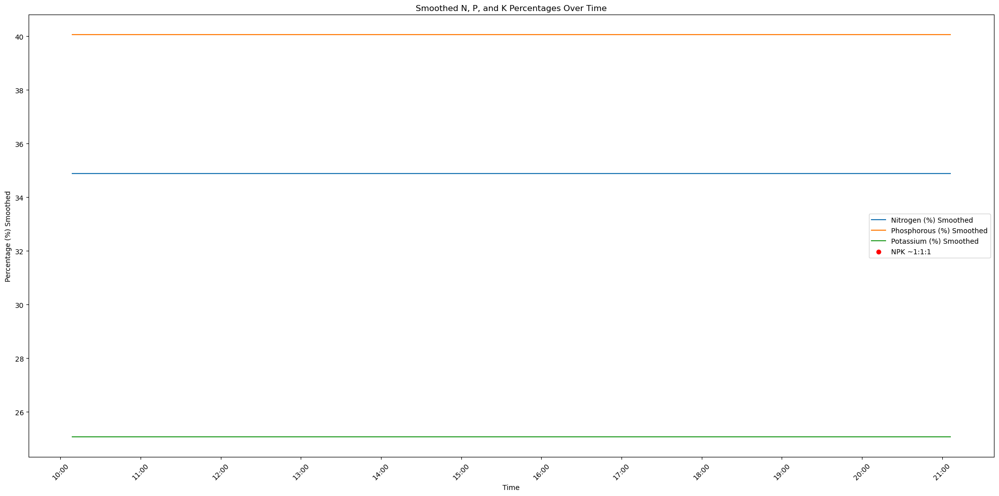

   N_Percentage  P_Percentage  K_Percentage
0     34.883721      40.05168     25.064599
1     34.883721      40.05168     25.064599
2     34.883721      40.05168     25.064599
3     34.883721      40.05168     25.064599
4     34.883721      40.05168     25.064599


In [20]:

# Convert the 'Phosphorous', 'Nitrogen', and 'Potassium' columns to numeric, coercing errors to NaN
rack1_1['Phosphorous01'] = pd.to_numeric(rack1_1['Phosphorous01'], errors='coerce')
rack1_1['Phosphorous02'] = pd.to_numeric(rack1_1['Phosphorous02'], errors='coerce')
rack1_1['Nitrogen01'] = pd.to_numeric(rack1_1['Nitrogen01'], errors='coerce')
rack1_1['Nitrogen02'] = pd.to_numeric(rack1_1['Nitrogen02'], errors='coerce')
rack1_1['Potassium01'] = pd.to_numeric(rack1_1['Potassium01'], errors='coerce')
rack1_1['Potassium02'] = pd.to_numeric(rack1_1['Potassium02'], errors='coerce')

# Calculate the window for rolling averages
window_size = 10
rack1_1['N_Percentage_Smooth'] = rack1_1['N_Percentage'].rolling(window=window_size).mean()
rack1_1['P_Percentage_Smooth'] = rack1_1['P_Percentage'].rolling(window=window_size).mean()
rack1_1['K_Percentage_Smooth'] = rack1_1['K_Percentage'].rolling(window=window_size).mean()

# Calculate the difference from the 1:1:1 ratio
tolerance = 0.1  # 10% tolerance for equal ratio
rack1_1['NPK_Equal'] = (np.abs(rack1_1['N_Percentage_Smooth'] - rack1_1['P_Percentage_Smooth']) < tolerance * rack1_1['N_Percentage_Smooth']) & \
                       (np.abs(rack1_1['P_Percentage_Smooth'] - rack1_1['K_Percentage_Smooth']) < tolerance * rack1_1['P_Percentage_Smooth']) & \
                       (np.abs(rack1_1['K_Percentage_Smooth'] - rack1_1['N_Percentage_Smooth']) < tolerance * rack1_1['K_Percentage_Smooth'])

# Convert 'Timestamp' to datetime
rack1_1['Timestamp'] = pd.to_datetime(rack1_1['Timestamp'])

# Define the figure size
plt.figure(figsize=(20, 10))

# Plot the smoothed lines
plt.plot(rack1_1['Timestamp'], rack1_1['N_Percentage_Smooth'], label='Nitrogen (%) Smoothed')
plt.plot(rack1_1['Timestamp'], rack1_1['P_Percentage_Smooth'], label='Phosphorous (%) Smoothed')
plt.plot(rack1_1['Timestamp'], rack1_1['K_Percentage_Smooth'], label='Potassium (%) Smoothed')

# Highlight points where the NPK ratio is close to 1:1:1
equal_npk = rack1_1[rack1_1['NPK_Equal']]
plt.scatter(equal_npk['Timestamp'], equal_npk['N_Percentage_Smooth'], color='red', label='NPK ~1:1:1', zorder=5)

# Set the title and labels
plt.title('Smoothed N, P, and K Percentages Over Time')
plt.xlabel('Time')
plt.ylabel('Percentage (%) Smoothed')

# Configure x-axis with time formatting
ax = plt.gca()  # Get current axes
ax.xaxis.set_major_locator(mdates.HourLocator(interval=1))  # Locate hours every hour
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))  # Show only hours and minutes

plt.xticks(rotation=45)  # Rotate for better readability
plt.tight_layout()  # Adjust layout to fit everything
plt.legend()
plt.show()
# Calculate the sum of the averaged readings for N, P, and K
rack1_1['Sum_NPK_Avg'] = ((rack1_1['Nitrogen01'] + rack1_1['Nitrogen02']) / 2) + \
                         ((rack1_1['Phosphorous01'] + rack1_1['Phosphorous02']) / 2) + \
                         ((rack1_1['Potassium01'] + rack1_1['Potassium02']) / 2)

# Calculate the percentage of N, P, and K relative to the sum of the averaged readings
rack1_1['N_Percentage'] = ((rack1_1['Nitrogen01'] + rack1_1['Nitrogen02']) / 2) / rack1_1['Sum_NPK_Avg'] * 100
rack1_1['P_Percentage'] = ((rack1_1['Phosphorous01'] + rack1_1['Phosphorous02']) / 2) / rack1_1['Sum_NPK_Avg'] * 100
rack1_1['K_Percentage'] = ((rack1_1['Potassium01'] + rack1_1['Potassium02']) / 2) / rack1_1['Sum_NPK_Avg'] * 100

# Check the new variables by displaying the first few rows
print(rack1_1[['N_Percentage', 'P_Percentage', 'K_Percentage']].head())

In [21]:
# Calculate the mean for N, P, and K percentages
average_N_percentage = rack1_1['N_Percentage'].mean()
average_P_percentage = rack1_1['P_Percentage'].mean()
average_K_percentage = rack1_1['K_Percentage'].mean()

# Output the averages
average_N_percentage, average_P_percentage, average_K_percentage

(34.88372093023256, 40.0516795865633, 25.064599483204137)

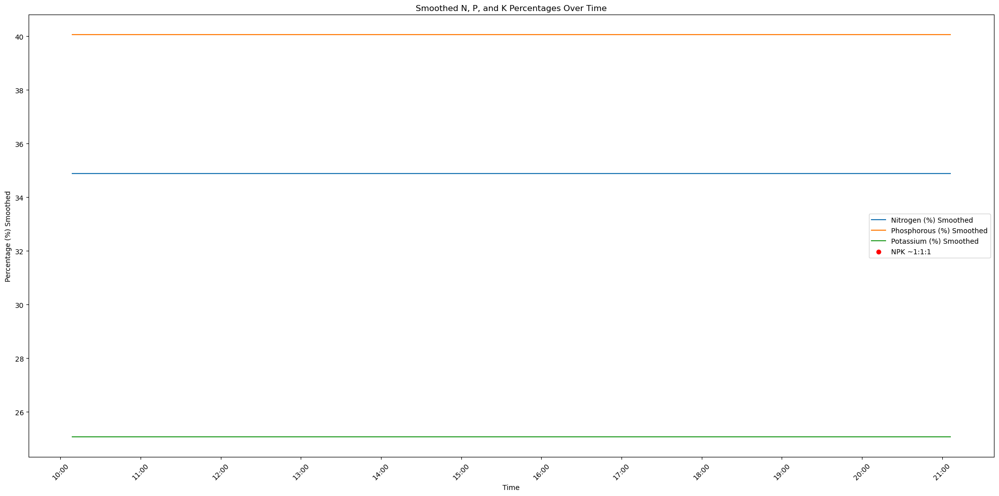

In [22]:

# Calculate the window for rolling averages
window_size = 10
rack1_1['N_Percentage_Smooth'] = rack1_1['N_Percentage'].rolling(window=window_size).mean()
rack1_1['P_Percentage_Smooth'] = rack1_1['P_Percentage'].rolling(window=window_size).mean()
rack1_1['K_Percentage_Smooth'] = rack1_1['K_Percentage'].rolling(window=window_size).mean()

# Calculate the difference from the 1:1:1 ratio
tolerance = 0.1  # 10% tolerance for equal ratio
rack1_1['NPK_Equal'] = (np.abs(rack1_1['N_Percentage_Smooth'] - rack1_1['P_Percentage_Smooth']) < tolerance * rack1_1['N_Percentage_Smooth']) & \
                       (np.abs(rack1_1['P_Percentage_Smooth'] - rack1_1['K_Percentage_Smooth']) < tolerance * rack1_1['P_Percentage_Smooth']) & \
                       (np.abs(rack1_1['K_Percentage_Smooth'] - rack1_1['N_Percentage_Smooth']) < tolerance * rack1_1['K_Percentage_Smooth'])

# Convert 'Timestamp' to datetime
rack1_1['Timestamp'] = pd.to_datetime(rack1_1['Timestamp'])

# Define the figure size
plt.figure(figsize=(20, 10))

# Plot the smoothed lines
plt.plot(rack1_1['Timestamp'], rack1_1['N_Percentage_Smooth'], label='Nitrogen (%) Smoothed')
plt.plot(rack1_1['Timestamp'], rack1_1['P_Percentage_Smooth'], label='Phosphorous (%) Smoothed')
plt.plot(rack1_1['Timestamp'], rack1_1['K_Percentage_Smooth'], label='Potassium (%) Smoothed')

# Highlight points where the NPK ratio is close to 1:1:1
equal_npk = rack1_1[rack1_1['NPK_Equal']]
plt.scatter(equal_npk['Timestamp'], equal_npk['N_Percentage_Smooth'], color='red', label='NPK ~1:1:1', zorder=5)

# Set the title and labels
plt.title('Smoothed N, P, and K Percentages Over Time')
plt.xlabel('Time')
plt.ylabel('Percentage (%) Smoothed')

# Configure x-axis with time formatting
ax = plt.gca()  # Get current axes
ax.xaxis.set_major_locator(mdates.HourLocator(interval=1))  # Locate hours every hour
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))  # Show only hours and minutes

plt.xticks(rotation=45)  # Rotate for better readability
plt.tight_layout()  # Adjust layout to fit everything
plt.legend()
plt.show()

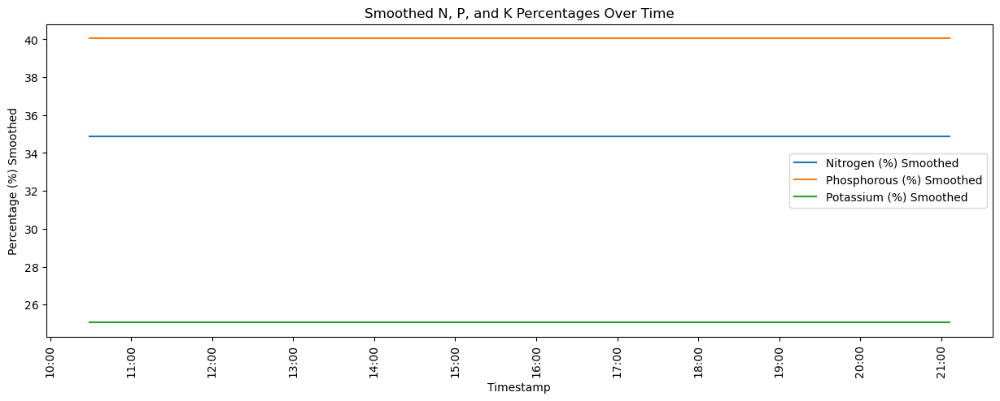

In [23]:
window_size = 30  # for example, a window of 10 data points
rack1_1['N_Percentage_Smooth'] = rack1_1['N_Percentage'].rolling(window=window_size).mean()
rack1_1['P_Percentage_Smooth'] = rack1_1['P_Percentage'].rolling(window=window_size).mean()
rack1_1['K_Percentage_Smooth'] = rack1_1['K_Percentage'].rolling(window=window_size).mean()

plt.figure(figsize=(15, 5))
plt.plot(rack1_1['Timestamp'], rack1_1['N_Percentage_Smooth'], label='Nitrogen (%) Smoothed')
plt.plot(rack1_1['Timestamp'], rack1_1['P_Percentage_Smooth'], label='Phosphorous (%) Smoothed')
plt.plot(rack1_1['Timestamp'], rack1_1['K_Percentage_Smooth'], label='Potassium (%) Smoothed')
plt.title('Smoothed N, P, and K Percentages Over Time')
plt.xlabel('Timestamp')
plt.ylabel('Percentage (%) Smoothed')
ax = plt.gca()  # Get current axes
ax.xaxis.set_major_locator(mdates.HourLocator(interval=1))  # Locate hours every hour
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))  # Show only hours and minutes
plt.legend()
plt.xticks(rotation=90)  # May need to rotate the x-axis labels to vertical if still too cluttered
plt.show()

### 6/4/24

In [24]:
rack1_1 = pd.read_csv('./dscpdata/Macpherson_1_6_4_24.csv')

In [25]:
rack1_1.head()

,Timestamp,Number of Worms (non-counted),Phosphorous01,Phosphorous02,Nitrogen01,Nitrogen02,Potassium01,Potassium02,Light Intensity,Temp01,Hum01,Heat01,SoilM01,SoilM02,Grams of Compost Harvested,Buzzer,Compost Notes
0,"6 Apr 2024, 10:00 AM",14.0,?,?,?,?,?,?,NaN,27.4,94.0,42.0,1.0,1.0,NaN,Off,NaN
1,"6 Apr 2024, 10:01 AM",14.0,?,?,?,?,?,?,NaN,27.4,97.0,42.0,1.0,1.0,NaN,Off,NaN
2,"6 Apr 2024, 10:02 AM",14.0,?,?,?,?,?,?,NaN,27.4,98.0,42.0,1.0,1.0,NaN,Off,NaN
3,"6 Apr 2024, 10:03 AM",14.0,?,?,?,?,?,?,NaN,27.4,96.0,42.0,1.0,1.0,NaN,Off,NaN
4,"6 Apr 2024, 10:04 AM",14.0,?,?,?,?,?,?,NaN,27.4,93.0,42.0,1.0,1.0,NaN,Off,NaN


In [26]:
rack1_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 999 entries, 0 to 998
Data columns (total 17 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Timestamp                      840 non-null    object 
 1   Number of Worms (non-counted)  588 non-null    float64
 2   Phosphorous01                  840 non-null    object 
 3   Phosphorous02                  840 non-null    object 
 4   Nitrogen01                     840 non-null    object 
 5   Nitrogen02                     840 non-null    object 
 6   Potassium01                    840 non-null    object 
 7   Potassium02                    840 non-null    object 
 8   Light Intensity                0 non-null      float64
 9   Temp01                         632 non-null    float64
 10  Hum01                          774 non-null    float64
 11  Heat01                         632 non-null    float64
 12  SoilM01                        502 non-null    flo

In [27]:
rack1_1.describe()

,Number of Worms (non-counted),Light Intensity,Temp01,Hum01,Heat01,SoilM01,SoilM02,Grams of Compost Harvested
count,588.0,0.0,632.000000,774.000000,632.000000,502.000000,502.000000,0.0
mean,14.0,NaN,29.447310,78.410853,41.957278,0.707171,0.902390,NaN
std,0.0,NaN,7.841977,37.233353,12.503936,0.455514,0.297082,NaN
min,14.0,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,NaN
25%,14.0,NaN,28.100000,93.000000,42.000000,0.000000,1.000000,NaN
50%,14.0,NaN,31.900000,95.000000,43.000000,1.000000,1.000000,NaN
75%,14.0,NaN,32.800000,97.000000,49.000000,1.000000,1.000000,NaN
max,14.0,NaN,34.600000,99.000000,51.000000,1.000000,1.000000,NaN


In [28]:
for column in ['Phosphorous01', 'Phosphorous02', 'Nitrogen01', 'Nitrogen02', 'Potassium01', 'Potassium02']:
    rack1_1[column] = pd.to_numeric(rack1_1[column], errors='coerce') 
    rack1_1[column] = rack1_1[column].fillna(0)  
    rack1_1[column] = rack1_1[column].astype(int)  

rack1_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 999 entries, 0 to 998
Data columns (total 17 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Timestamp                      840 non-null    object 
 1   Number of Worms (non-counted)  588 non-null    float64
 2   Phosphorous01                  999 non-null    int32  
 3   Phosphorous02                  999 non-null    int32  
 4   Nitrogen01                     999 non-null    int32  
 5   Nitrogen02                     999 non-null    int32  
 6   Potassium01                    999 non-null    int32  
 7   Potassium02                    999 non-null    int32  
 8   Light Intensity                0 non-null      float64
 9   Temp01                         632 non-null    float64
 10  Hum01                          774 non-null    float64
 11  Heat01                         632 non-null    float64
 12  SoilM01                        502 non-null    flo

In [29]:
rack1_1['Timestamp'] = pd.to_datetime(rack1_1['Timestamp'])
# rack1_1['Timestamp'] = rack1_1['Timestamp'].dt.strftime('%H:%M')
# rack1_1.head()

In [ ]:
color = []
missing_counts = rack1_1.isnull().sum()

plt.figure(figsize=(10, 6))  # Set the figure size

missing_counts.plot(kind='bar')


plt.title('Number of Missing Data by Variable')  # Set the title
plt.xlabel('Variables')  # Set the x-axis label
plt.ylabel('Number of Missing Data')  # Set the y-axis label

plt.show()

### Trend over time

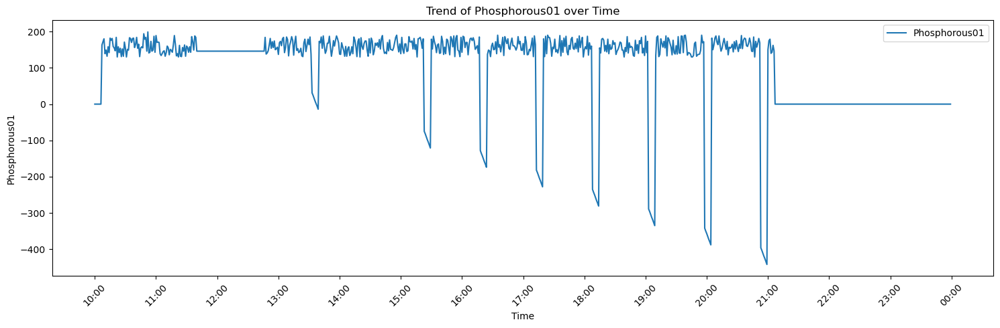

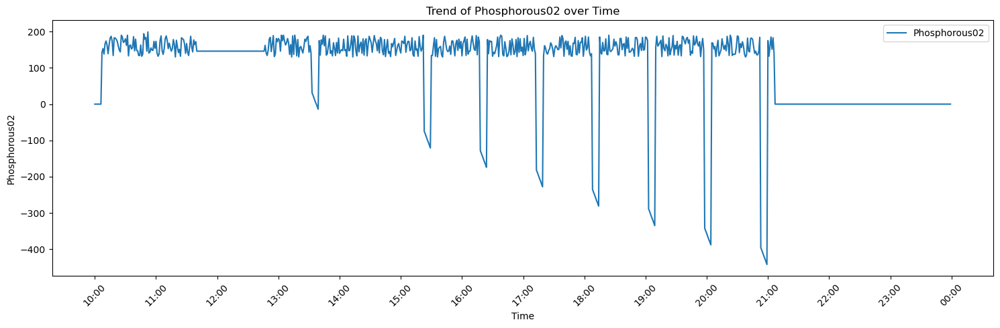

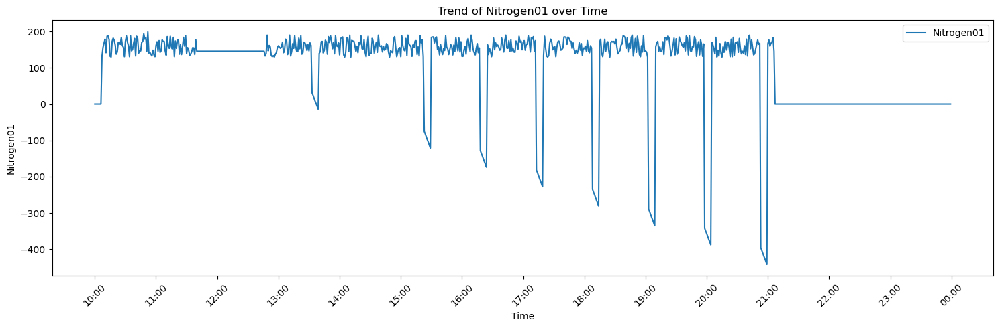

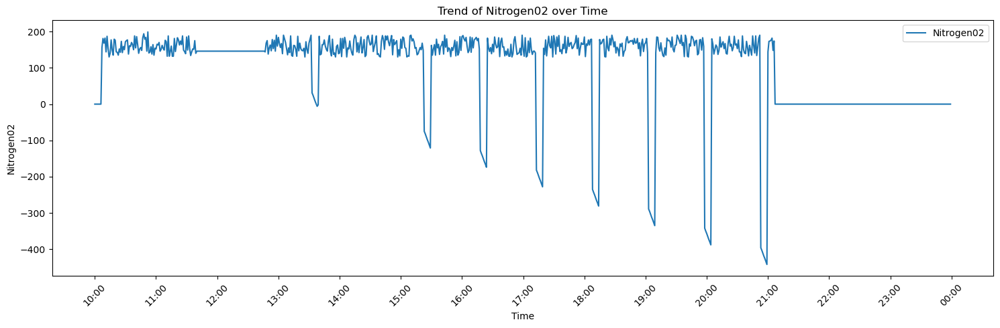

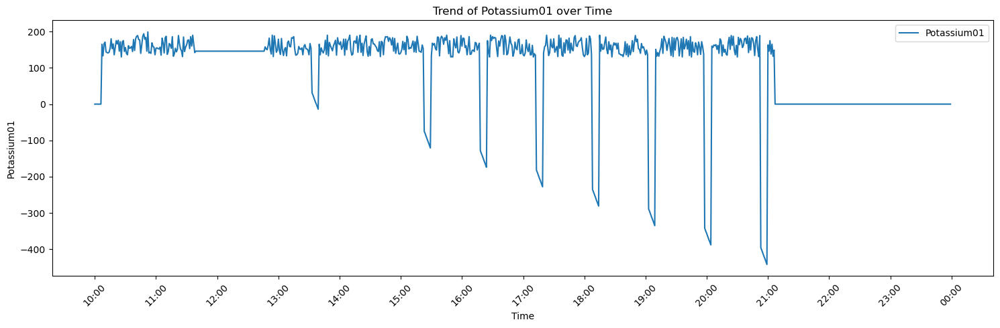

...

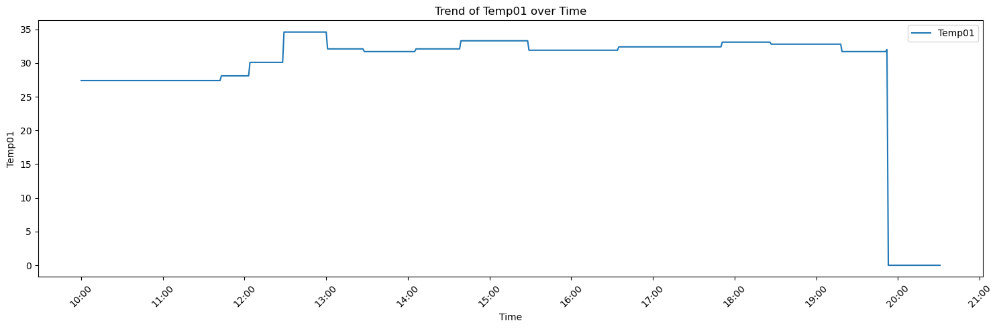

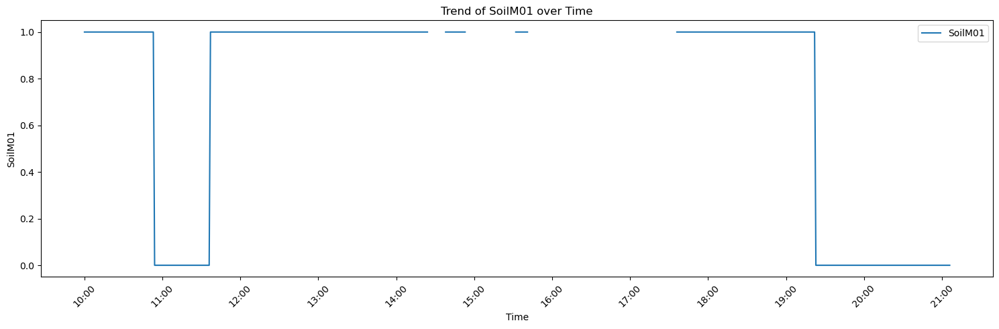

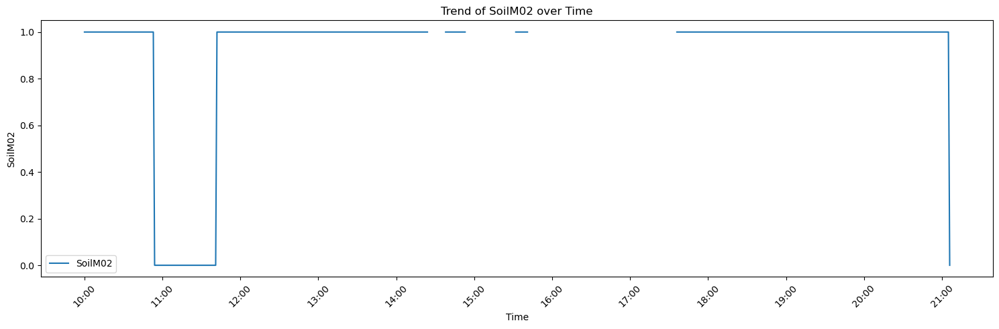

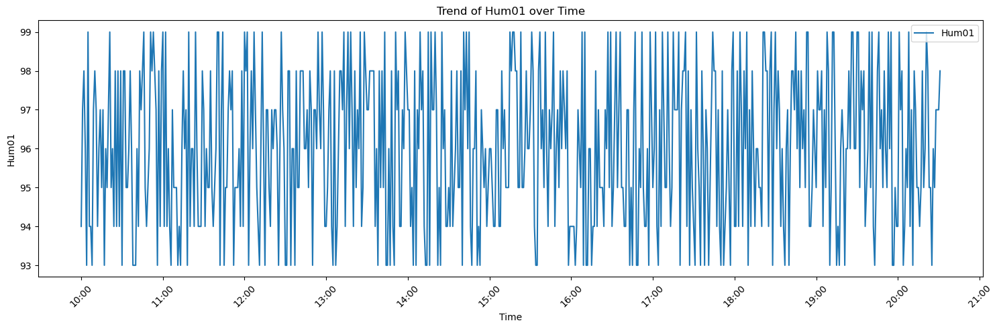

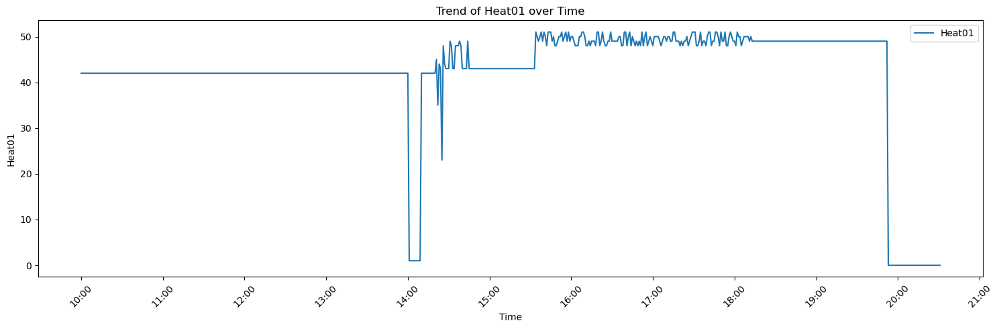

In [30]:
import matplotlib.dates as mdates

# Assuming 'Timestamp' is already converted to a datetime format in rack1_1 DataFrame

# Now, plot each variable over time
variables_to_plot = ['Phosphorous01', 'Phosphorous02', 'Nitrogen01', 'Nitrogen02', 
                     'Potassium01', 'Potassium02', 'Temp01', 'SoilM01', 'SoilM02',
                     'Hum01', 'Heat01']

for variable in variables_to_plot:
    plt.figure(figsize=(15, 5))
    plt.plot(rack1_1['Timestamp'], rack1_1[variable], label=variable)
    plt.title(f'Trend of {variable} over Time')
    plt.xlabel('Time')
    plt.ylabel(variable)

    # Configure x-axis with time formatting
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.HourLocator(interval=1))  # Locate hours every hour
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))  # Show only hours and minutes

    plt.xticks(rotation=45)  # Rotate for better readability
    plt.legend()
    plt.tight_layout()  # Adjust layout to fit everything
    plt.show()


### NPK Ratio

In [31]:


# Convert the 'Phosphorous', 'Nitrogen', and 'Potassium' columns to numeric, coercing errors to NaN
rack1_1['Phosphorous01'] = pd.to_numeric(rack1_1['Phosphorous01'], errors='coerce')
rack1_1['Phosphorous02'] = pd.to_numeric(rack1_1['Phosphorous02'], errors='coerce')
rack1_1['Nitrogen01'] = pd.to_numeric(rack1_1['Nitrogen01'], errors='coerce')
rack1_1['Nitrogen02'] = pd.to_numeric(rack1_1['Nitrogen02'], errors='coerce')
rack1_1['Potassium01'] = pd.to_numeric(rack1_1['Potassium01'], errors='coerce')
rack1_1['Potassium02'] = pd.to_numeric(rack1_1['Potassium02'], errors='coerce')

# Calculate the sum of the averaged readings for N, P, and K
rack1_1['Sum_NPK_Avg'] = ((rack1_1['Nitrogen01'] + rack1_1['Nitrogen02']) / 2) + \
                         ((rack1_1['Phosphorous01'] + rack1_1['Phosphorous02']) / 2) + \
                         ((rack1_1['Potassium01'] + rack1_1['Potassium02']) / 2)

# Calculate the percentage of N, P, and K relative to the sum of the averaged readings
rack1_1['N_Percentage'] = ((rack1_1['Nitrogen01'] + rack1_1['Nitrogen02']) / 2) / rack1_1['Sum_NPK_Avg'] * 100
rack1_1['P_Percentage'] = ((rack1_1['Phosphorous01'] + rack1_1['Phosphorous02']) / 2) / rack1_1['Sum_NPK_Avg'] * 100
rack1_1['K_Percentage'] = ((rack1_1['Potassium01'] + rack1_1['Potassium02']) / 2) / rack1_1['Sum_NPK_Avg'] * 100

# Check the new variables by displaying the first few rows
print(rack1_1[['N_Percentage', 'P_Percentage', 'K_Percentage']].head())

   N_Percentage  P_Percentage  K_Percentage
0           NaN           NaN           NaN
1           NaN           NaN           NaN
2           NaN           NaN           NaN
3           NaN           NaN           NaN
4           NaN           NaN           NaN


In [32]:
# Calculate the mean for N, P, and K percentages
average_N_percentage = rack1_1['N_Percentage'].mean()
average_P_percentage = rack1_1['P_Percentage'].mean()
average_K_percentage = rack1_1['K_Percentage'].mean()

# Output the averages
average_N_percentage, average_P_percentage, average_K_percentage

(33.32415540788548, 33.32215243438864, 33.353692157725874)

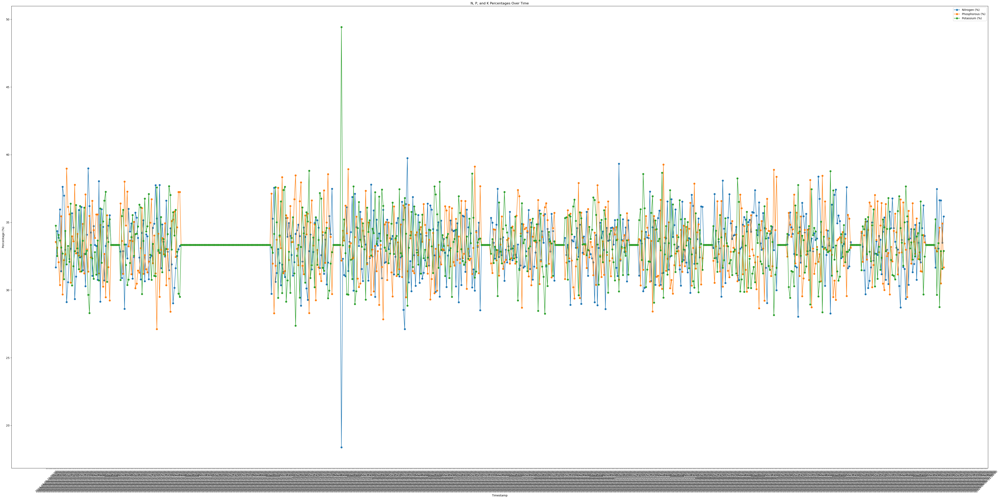

In [33]:
rack1_1['Timestamp'] = rack1_1['Timestamp'].astype(str).fillna('placeholder')

plt.figure(figsize=(50, 25))

# Plot each nutrient's percentage
plt.plot(rack1_1['Timestamp'], rack1_1['N_Percentage'], label='Nitrogen (%)', marker='o')
plt.plot(rack1_1['Timestamp'], rack1_1['P_Percentage'], label='Phosphorous (%)', marker='o')
plt.plot(rack1_1['Timestamp'], rack1_1['K_Percentage'], label='Potassium (%)', marker='o')

# Add labels and title
plt.title('N, P, and K Percentages Over Time')
plt.xlabel('Timestamp')
plt.ylabel('Percentage (%)')

# Rotate the x-axis labels to prevent overlap
plt.xticks(rotation=45)

# Add a legend to distinguish between lines
plt.legend()

# Adjust the layout
plt.tight_layout()

# Display the plot
plt.show()

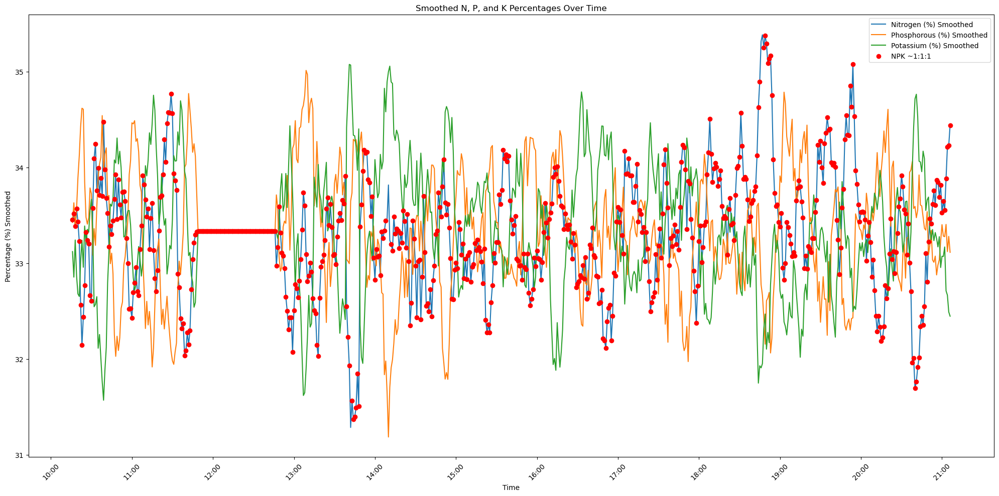

In [34]:
window_size = 10
rack1_1['N_Percentage_Smooth'] = rack1_1['N_Percentage'].rolling(window=window_size).mean()
rack1_1['P_Percentage_Smooth'] = rack1_1['P_Percentage'].rolling(window=window_size).mean()
rack1_1['K_Percentage_Smooth'] = rack1_1['K_Percentage'].rolling(window=window_size).mean()

# Calculate the difference from the 1:1:1 ratio
tolerance = 0.1  # 10% tolerance for equal ratio
rack1_1['NPK_Equal'] = (np.abs(rack1_1['N_Percentage_Smooth'] - rack1_1['P_Percentage_Smooth']) < tolerance * rack1_1['N_Percentage_Smooth']) & \
                       (np.abs(rack1_1['P_Percentage_Smooth'] - rack1_1['K_Percentage_Smooth']) < tolerance * rack1_1['P_Percentage_Smooth']) & \
                       (np.abs(rack1_1['K_Percentage_Smooth'] - rack1_1['N_Percentage_Smooth']) < tolerance * rack1_1['K_Percentage_Smooth'])

# Convert 'Timestamp' to datetime
rack1_1['Timestamp'] = pd.to_datetime(rack1_1['Timestamp'])

# Define the figure size
plt.figure(figsize=(20, 10))

# Plot the smoothed lines
plt.plot(rack1_1['Timestamp'], rack1_1['N_Percentage_Smooth'], label='Nitrogen (%) Smoothed')
plt.plot(rack1_1['Timestamp'], rack1_1['P_Percentage_Smooth'], label='Phosphorous (%) Smoothed')
plt.plot(rack1_1['Timestamp'], rack1_1['K_Percentage_Smooth'], label='Potassium (%) Smoothed')

# Highlight points where the NPK ratio is close to 1:1:1
equal_npk = rack1_1[rack1_1['NPK_Equal']]
plt.scatter(equal_npk['Timestamp'], equal_npk['N_Percentage_Smooth'], color='red', label='NPK ~1:1:1', zorder=5)

# Set the title and labels
plt.title('Smoothed N, P, and K Percentages Over Time')
plt.xlabel('Time')
plt.ylabel('Percentage (%) Smoothed')

# Configure x-axis with time formatting
ax = plt.gca()  # Get current axes
ax.xaxis.set_major_locator(mdates.HourLocator(interval=1))  # Locate hours every hour
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))  # Show only hours and minutes

plt.xticks(rotation=45)  # Rotate for better readability
plt.tight_layout()  # Adjust layout to fit everything
plt.legend()
plt.show()

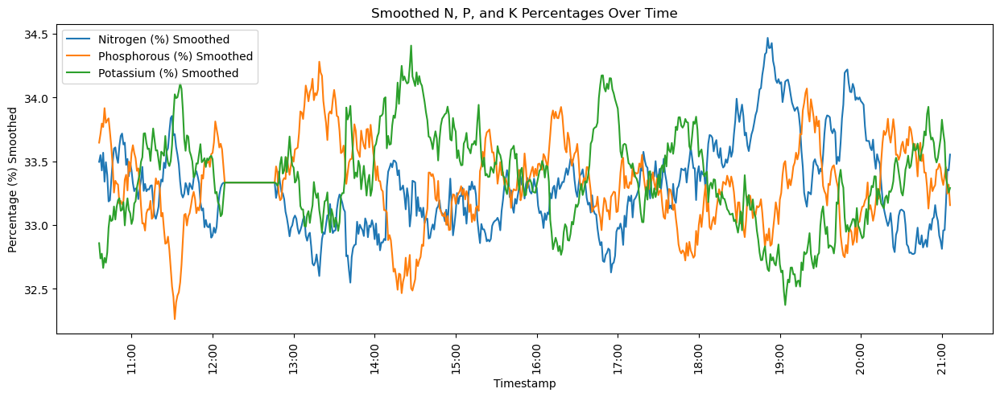

In [35]:
window_size = 30  # for example, a window of 10 data points
rack1_1['N_Percentage_Smooth'] = rack1_1['N_Percentage'].rolling(window=window_size).mean()
rack1_1['P_Percentage_Smooth'] = rack1_1['P_Percentage'].rolling(window=window_size).mean()
rack1_1['K_Percentage_Smooth'] = rack1_1['K_Percentage'].rolling(window=window_size).mean()

plt.figure(figsize=(15, 5))
plt.plot(rack1_1['Timestamp'], rack1_1['N_Percentage_Smooth'], label='Nitrogen (%) Smoothed')
plt.plot(rack1_1['Timestamp'], rack1_1['P_Percentage_Smooth'], label='Phosphorous (%) Smoothed')
plt.plot(rack1_1['Timestamp'], rack1_1['K_Percentage_Smooth'], label='Potassium (%) Smoothed')
plt.title('Smoothed N, P, and K Percentages Over Time')
plt.xlabel('Timestamp')
plt.ylabel('Percentage (%) Smoothed')
ax = plt.gca()  # Get current axes
ax.xaxis.set_major_locator(mdates.HourLocator(interval=1))  # Locate hours every hour
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))  # Show only hours and minutes
plt.legend()
plt.xticks(rotation=90)  # May need to rotate the x-axis labels to vertical if still too cluttered
plt.show()

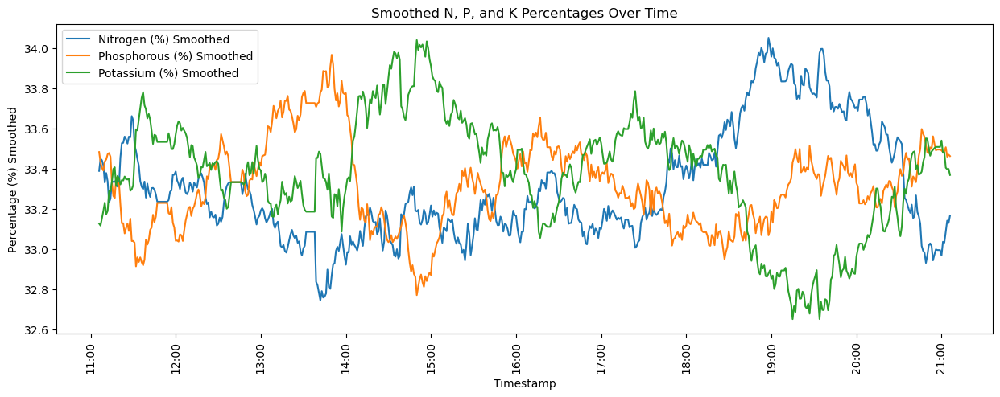

In [36]:
window_size = 60  # for example, a window of 10 data points
rack1_1['N_Percentage_Smooth'] = rack1_1['N_Percentage'].rolling(window=window_size).mean()
rack1_1['P_Percentage_Smooth'] = rack1_1['P_Percentage'].rolling(window=window_size).mean()
rack1_1['K_Percentage_Smooth'] = rack1_1['K_Percentage'].rolling(window=window_size).mean()

plt.figure(figsize=(15, 5))
plt.plot(rack1_1['Timestamp'], rack1_1['N_Percentage_Smooth'], label='Nitrogen (%) Smoothed')
plt.plot(rack1_1['Timestamp'], rack1_1['P_Percentage_Smooth'], label='Phosphorous (%) Smoothed')
plt.plot(rack1_1['Timestamp'], rack1_1['K_Percentage_Smooth'], label='Potassium (%) Smoothed')
plt.title('Smoothed N, P, and K Percentages Over Time')
plt.xlabel('Timestamp')
plt.ylabel('Percentage (%) Smoothed')
ax = plt.gca()  # Get current axes
ax.xaxis.set_major_locator(mdates.HourLocator(interval=1))  # Locate hours every hour
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))  # Show only hours and minutes
plt.legend()
plt.xticks(rotation=90)  # May need to rotate the x-axis labels to vertical if still too cluttered
plt.show()

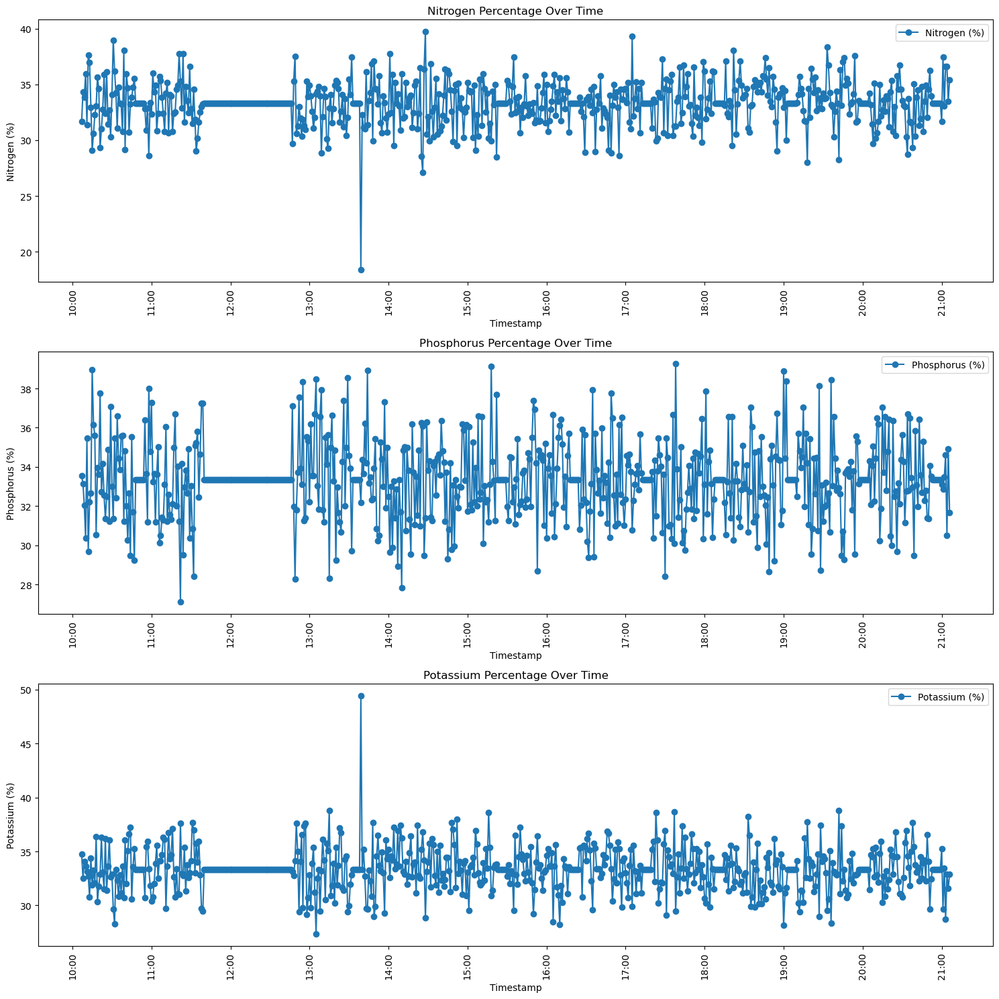

In [37]:
import matplotlib.pyplot as plt

# Define the size of the entire plotting area
plt.figure(figsize=(15, 15))

# Subplot for Nitrogen
plt.subplot(3, 1, 1)  # (number of rows, number of columns, subplot number)
plt.plot(rack1_1['Timestamp'], rack1_1['N_Percentage'], label='Nitrogen (%)', marker='o', linestyle='-')
plt.title('Nitrogen Percentage Over Time')
plt.xlabel('Timestamp')
plt.ylabel('Nitrogen (%)')
plt.xticks(rotation=90)
plt.legend()
ax = plt.gca()  # Get current axes
ax.xaxis.set_major_locator(mdates.HourLocator(interval=1))  # Locate hours every hour
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))  # Show only hours and minutes
# Subplot for Phosphorus
plt.subplot(3, 1, 2)
plt.plot(rack1_1['Timestamp'], rack1_1['P_Percentage'], label='Phosphorus (%)', marker='o', linestyle='-')
plt.title('Phosphorus Percentage Over Time')
plt.xlabel('Timestamp')
plt.ylabel('Phosphorus (%)')
plt.xticks(rotation=90)
plt.legend()
ax = plt.gca()  # Get current axes
ax.xaxis.set_major_locator(mdates.HourLocator(interval=1))  # Locate hours every hour
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))  # Show only hours and minutes
# Subplot for Potassium
plt.subplot(3, 1, 3)
plt.plot(rack1_1['Timestamp'], rack1_1['K_Percentage'], label='Potassium (%)', marker='o', linestyle='-')
plt.title('Potassium Percentage Over Time')
plt.xlabel('Timestamp')
plt.ylabel('Potassium (%)')
plt.xticks(rotation=90)
plt.legend()
ax = plt.gca()  # Get current axes
ax.xaxis.set_major_locator(mdates.HourLocator(interval=1))  # Locate hours every hour
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))  # Show only hours and minutes

# Adjust the layout so that all subplots fit into the figure area
plt.tight_layout()

# Show the plots
plt.show()


### 10/4/24

In [38]:
rack1_1 = pd.read_csv('./dscpdata/MacPherson_1_10_4_24.csv')

In [39]:
rack1_1.head()

,Timestamp,Number of Worms (non-counted),Phosphorous01,Phosphorous02,Nitrogen01,Nitrogen02,Potassium01,Potassium02,Light Intensity,Temp01,...,SoilM01,SoilM02,Grams of Compost Harvested,Buzzer,Unnamed: 16,Unnamed: 17,Unnamed: 18,Unnamed: 19,Unnamed: 20,Unnamed: 21
0,"5 Apr 2024, 10:00 AM",14,135,146,193,193,193,193,NaN,27.4,...,1.0,1.0,NaN,Off,NaN,NaN,NaN,NaN,NaN,NaN
1,"5 Apr 2024, 10:01 AM",14,133,131,172,145,156,145,NaN,27.4,...,1.0,1.0,NaN,Off,NaN,NaN,NaN,NaN,NaN,NaN
2,"5 Apr 2024, 10:02 AM",14,133,149,160,145,142,140,NaN,27.4,...,1.0,1.0,NaN,Off,NaN,NaN,NaN,NaN,NaN,NaN
3,"5 Apr 2024, 10:03 AM",14,178,185,162,143,193,173,NaN,27.4,...,1.0,1.0,NaN,Off,NaN,NaN,NaN,NaN,NaN,NaN
4,"5 Apr 2024, 10:04 AM",14,149,135,185,162,181,187,NaN,27.4,...,1.0,1.0,NaN,Off,NaN,NaN,NaN,NaN,NaN,NaN


In [40]:
rack1_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 999 entries, 0 to 998
Data columns (total 22 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Timestamp                      999 non-null    object 
 1   Number of Worms (non-counted)  655 non-null    object 
 2   Phosphorous01                  998 non-null    object 
 3   Phosphorous02                  998 non-null    object 
 4   Nitrogen01                     998 non-null    object 
 5   Nitrogen02                     998 non-null    object 
 6   Potassium01                    998 non-null    object 
 7   Potassium02                    998 non-null    object 
 8   Light Intensity                0 non-null      float64
 9   Temp01                         774 non-null    float64
 10  Hum01                          774 non-null    float64
 11  Heat01                         774 non-null    float64
 12  SoilM01                        644 non-null    flo

In [41]:
rack1_1.describe()

,Light Intensity,Temp01,Hum01,Heat01,SoilM01,SoilM02,Grams of Compost Harvested,Unnamed: 16,Unnamed: 17,Unnamed: 18,Unnamed: 19,Unnamed: 20,Unnamed: 21
count,0.0,774.000000,774.000000,774.000000,644.000000,644.000000,142.0,142.0,142.0,142.0,142.0,142.0,142.0
mean,NaN,24.044832,78.378553,31.854005,0.551242,0.703416,0.0,0.0,0.0,0.0,0.0,0.0,0.0
std,NaN,13.426444,37.220543,18.492140,0.497754,0.457106,0.0,0.0,0.0,0.0,0.0,0.0,0.0
min,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25%,NaN,27.400000,93.000000,1.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
50%,NaN,31.700000,95.000000,42.000000,1.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
75%,NaN,32.400000,97.000000,43.000000,1.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
max,NaN,34.600000,99.000000,49.000000,1.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [42]:
for column in ['Phosphorous01', 'Phosphorous02', 'Nitrogen01', 'Nitrogen02', 'Potassium01', 'Potassium02']:
    rack1_1[column] = pd.to_numeric(rack1_1[column], errors='coerce') 
    rack1_1[column] = rack1_1[column].fillna(0)  
    rack1_1[column] = rack1_1[column].astype(int)  

rack1_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 999 entries, 0 to 998
Data columns (total 22 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Timestamp                      999 non-null    object 
 1   Number of Worms (non-counted)  655 non-null    object 
 2   Phosphorous01                  999 non-null    int32  
 3   Phosphorous02                  999 non-null    int32  
 4   Nitrogen01                     999 non-null    int32  
 5   Nitrogen02                     999 non-null    int32  
 6   Potassium01                    999 non-null    int32  
 7   Potassium02                    999 non-null    int32  
 8   Light Intensity                0 non-null      float64
 9   Temp01                         774 non-null    float64
 10  Hum01                          774 non-null    float64
 11  Heat01                         774 non-null    float64
 12  SoilM01                        644 non-null    flo

In [43]:
rack1_1['Timestamp'] = pd.to_datetime(rack1_1['Timestamp'])
# rack1_1['Timestamp'] = rack1_1['Timestamp'].dt.strftime('%H:%M')
# rack1_1.head()

In [ ]:
#Visualising missing data
color = []
missing_counts = rack1_1.isnull().sum()

plt.figure(figsize=(10, 6))  # Set the figure size

missing_counts.plot(kind='bar')


plt.title('Number of Missing Data by Variable')  # Set the title
plt.xlabel('Variables')  # Set the x-axis label
plt.ylabel('Number of Missing Data')  # Set the y-axis label

plt.show()

### Trend over time

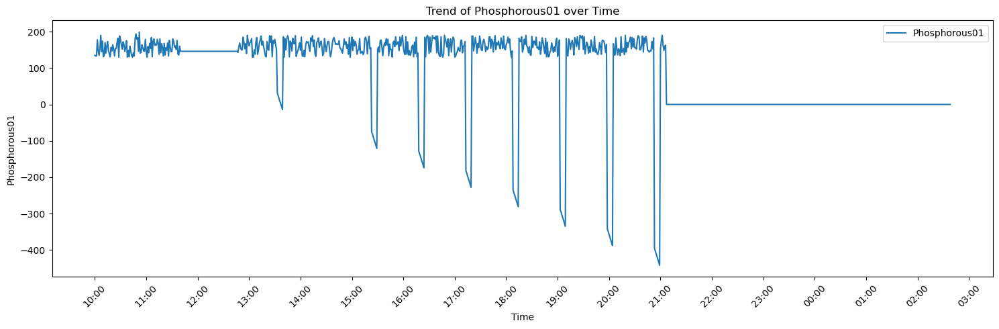

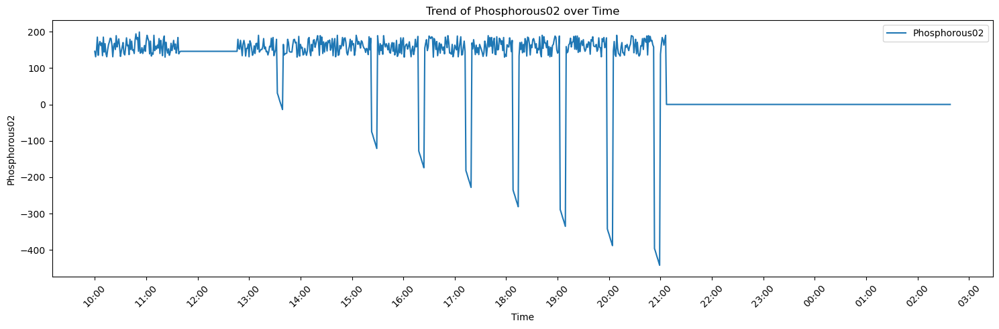

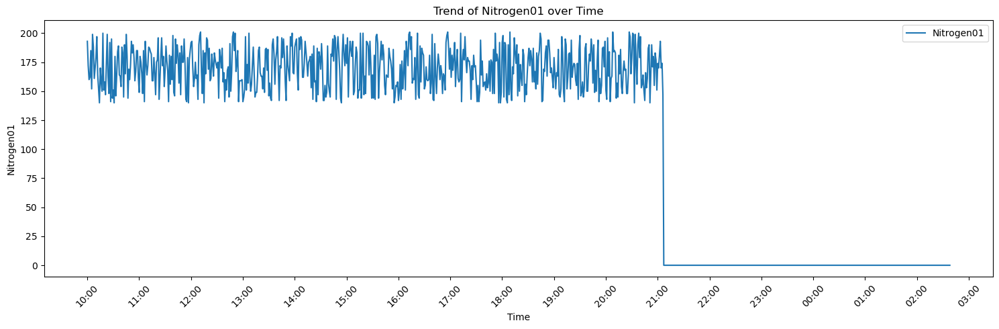

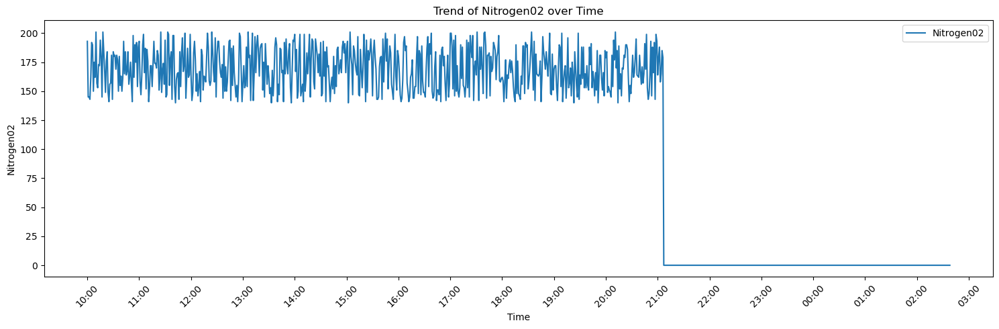

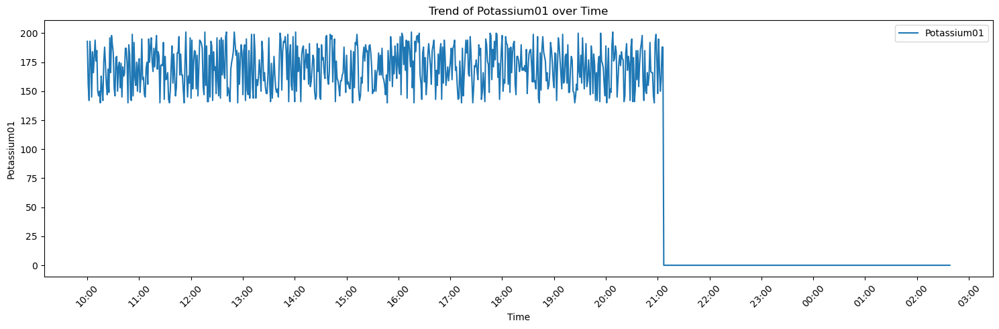

...

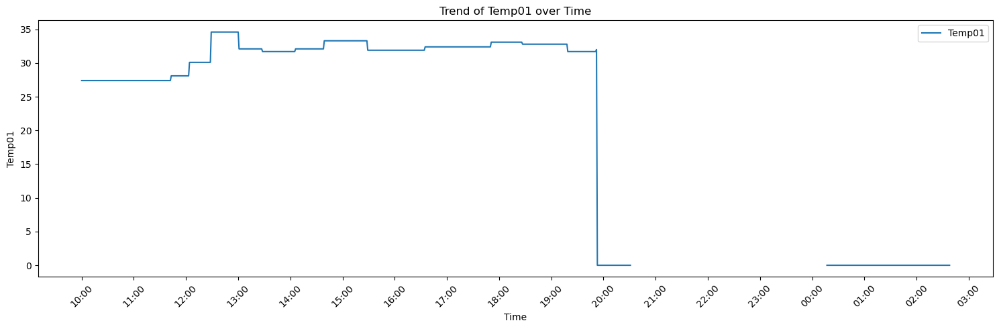

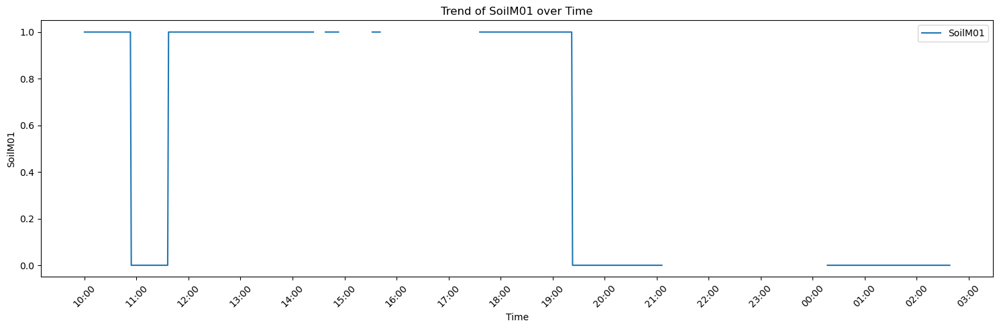

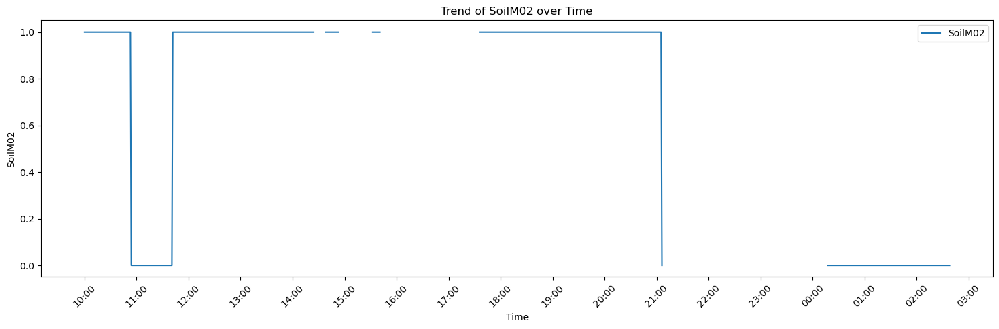

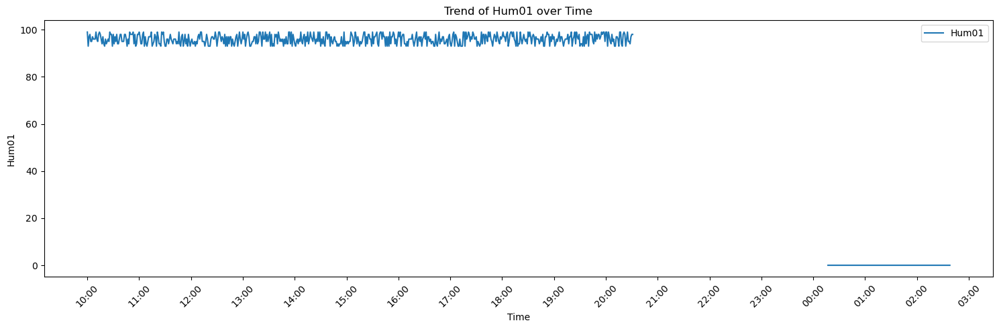

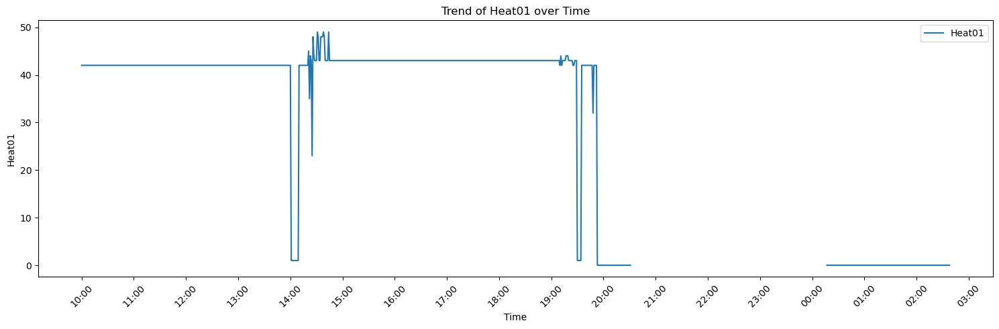

In [44]:
import matplotlib.dates as mdates

# Assuming 'Timestamp' is already converted to a datetime format in rack1_1 DataFrame

# Now, plot each variable over time
variables_to_plot = ['Phosphorous01', 'Phosphorous02', 'Nitrogen01', 'Nitrogen02', 
                     'Potassium01', 'Potassium02', 'Temp01', 'SoilM01', 'SoilM02',
                     'Hum01', 'Heat01']

for variable in variables_to_plot:
    plt.figure(figsize=(15, 5))
    plt.plot(rack1_1['Timestamp'], rack1_1[variable], label=variable)
    plt.title(f'Trend of {variable} over Time')
    plt.xlabel('Time')
    plt.ylabel(variable)

    # Configure x-axis with time formatting
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.HourLocator(interval=1))  # Locate hours every hour
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))  # Show only hours and minutes

    plt.xticks(rotation=45)  # Rotate for better readability
    plt.legend()
    plt.tight_layout()  # Adjust layout to fit everything
    plt.show()

### NPK Ratio

In [45]:

# Convert the 'Phosphorous', 'Nitrogen', and 'Potassium' columns to numeric, coercing errors to NaN
rack1_1['Phosphorous01'] = pd.to_numeric(rack1_1['Phosphorous01'], errors='coerce')
rack1_1['Phosphorous02'] = pd.to_numeric(rack1_1['Phosphorous02'], errors='coerce')
rack1_1['Nitrogen01'] = pd.to_numeric(rack1_1['Nitrogen01'], errors='coerce')
rack1_1['Nitrogen02'] = pd.to_numeric(rack1_1['Nitrogen02'], errors='coerce')
rack1_1['Potassium01'] = pd.to_numeric(rack1_1['Potassium01'], errors='coerce')
rack1_1['Potassium02'] = pd.to_numeric(rack1_1['Potassium02'], errors='coerce')

# Calculate the sum of the averaged readings for N, P, and K
rack1_1['Sum_NPK_Avg'] = ((rack1_1['Nitrogen01'] + rack1_1['Nitrogen02']) / 2) + \
                         ((rack1_1['Phosphorous01'] + rack1_1['Phosphorous02']) / 2) + \
                         ((rack1_1['Potassium01'] + rack1_1['Potassium02']) / 2)

# Calculate the percentage of N, P, and K relative to the sum of the averaged readings
rack1_1['N_Percentage'] = ((rack1_1['Nitrogen01'] + rack1_1['Nitrogen02']) / 2) / rack1_1['Sum_NPK_Avg'] * 100
rack1_1['P_Percentage'] = ((rack1_1['Phosphorous01'] + rack1_1['Phosphorous02']) / 2) / rack1_1['Sum_NPK_Avg'] * 100
rack1_1['K_Percentage'] = ((rack1_1['Potassium01'] + rack1_1['Potassium02']) / 2) / rack1_1['Sum_NPK_Avg'] * 100

# Check the new variables by displaying the first few rows
print(rack1_1[['N_Percentage', 'P_Percentage', 'K_Percentage']].head())

   N_Percentage  P_Percentage  K_Percentage
0     36.657170     26.685660     36.657170
1     35.941043     29.931973     34.126984
2     35.097814     32.451093     32.451093
3     29.497099     35.106383     35.396518
4     34.734735     28.428428     36.836837


In [46]:
average_N_percentage = rack1_1['N_Percentage'].mean()
average_P_percentage = rack1_1['P_Percentage'].mean()
average_K_percentage = rack1_1['K_Percentage'].mean()

# Output the averages
average_N_percentage, average_P_percentage, average_K_percentage

(47.31707027290185, 7.1814317317402026, 45.501497995357944)

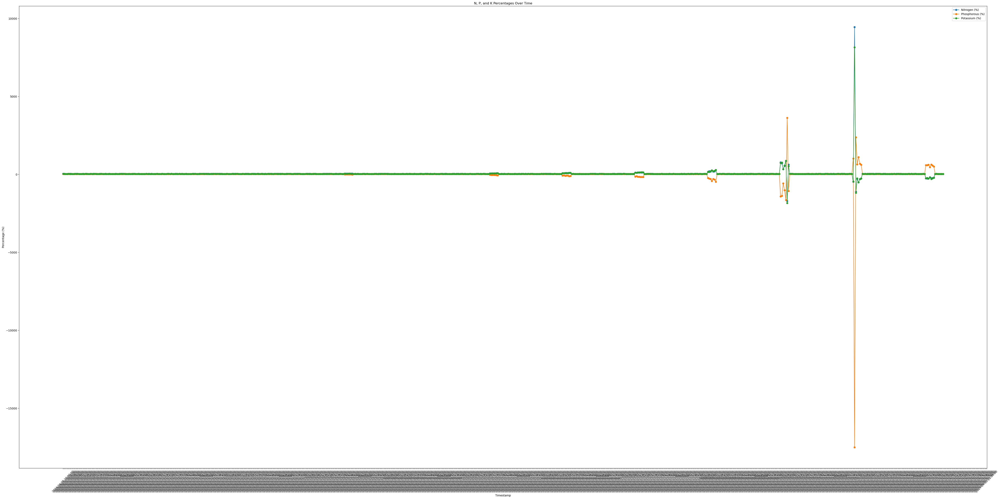

In [47]:

rack1_1['Timestamp'] = rack1_1['Timestamp'].astype(str).fillna('placeholder')

plt.figure(figsize=(50, 25))

# Plot each nutrient's percentage
plt.plot(rack1_1['Timestamp'], rack1_1['N_Percentage'], label='Nitrogen (%)', marker='o')
plt.plot(rack1_1['Timestamp'], rack1_1['P_Percentage'], label='Phosphorous (%)', marker='o')
plt.plot(rack1_1['Timestamp'], rack1_1['K_Percentage'], label='Potassium (%)', marker='o')

# Add labels and title
plt.title('N, P, and K Percentages Over Time')
plt.xlabel('Timestamp')
plt.ylabel('Percentage (%)')

# Rotate the x-axis labels to prevent overlap
plt.xticks(rotation=45)

# Add a legend to distinguish between lines
plt.legend()

# Adjust the layout
plt.tight_layout()

# Display the plot
plt.show()

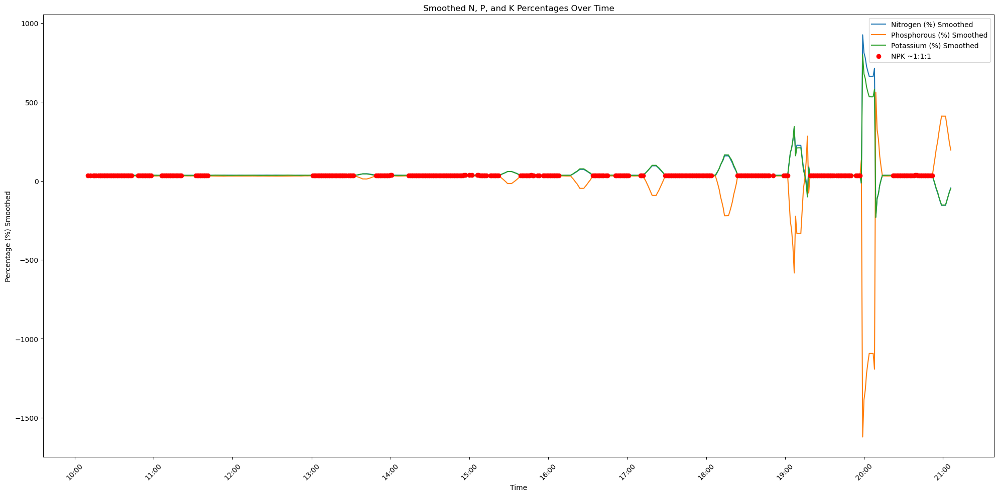

In [48]:
# Assuming rack1_1 is your DataFrame and you've already computed 'N_Percentage_Smooth', 'P_Percentage_Smooth', and 'K_Percentage_Smooth'

# Calculate the window for rolling averages
window_size = 10
rack1_1['N_Percentage_Smooth'] = rack1_1['N_Percentage'].rolling(window=window_size).mean()
rack1_1['P_Percentage_Smooth'] = rack1_1['P_Percentage'].rolling(window=window_size).mean()
rack1_1['K_Percentage_Smooth'] = rack1_1['K_Percentage'].rolling(window=window_size).mean()

# Calculate the difference from the 1:1:1 ratio
tolerance = 0.1  # 10% tolerance for equal ratio
rack1_1['NPK_Equal'] = (np.abs(rack1_1['N_Percentage_Smooth'] - rack1_1['P_Percentage_Smooth']) < tolerance * rack1_1['N_Percentage_Smooth']) & \
                       (np.abs(rack1_1['P_Percentage_Smooth'] - rack1_1['K_Percentage_Smooth']) < tolerance * rack1_1['P_Percentage_Smooth']) & \
                       (np.abs(rack1_1['K_Percentage_Smooth'] - rack1_1['N_Percentage_Smooth']) < tolerance * rack1_1['K_Percentage_Smooth'])

# Convert 'Timestamp' to datetime
rack1_1['Timestamp'] = pd.to_datetime(rack1_1['Timestamp'])

# Define the figure size
plt.figure(figsize=(20, 10))

# Plot the smoothed lines
plt.plot(rack1_1['Timestamp'], rack1_1['N_Percentage_Smooth'], label='Nitrogen (%) Smoothed')
plt.plot(rack1_1['Timestamp'], rack1_1['P_Percentage_Smooth'], label='Phosphorous (%) Smoothed')
plt.plot(rack1_1['Timestamp'], rack1_1['K_Percentage_Smooth'], label='Potassium (%) Smoothed')

# Highlight points where the NPK ratio is close to 1:1:1
equal_npk = rack1_1[rack1_1['NPK_Equal']]
plt.scatter(equal_npk['Timestamp'], equal_npk['N_Percentage_Smooth'], color='red', label='NPK ~1:1:1', zorder=5)

# Set the title and labels
plt.title('Smoothed N, P, and K Percentages Over Time')
plt.xlabel('Time')
plt.ylabel('Percentage (%) Smoothed')

# Configure x-axis with time formatting
ax = plt.gca()  # Get current axes
ax.xaxis.set_major_locator(mdates.HourLocator(interval=1))  # Locate hours every hour
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))  # Show only hours and minutes

plt.xticks(rotation=45)  # Rotate for better readability
plt.tight_layout()  # Adjust layout to fit everything
plt.legend()
plt.show()

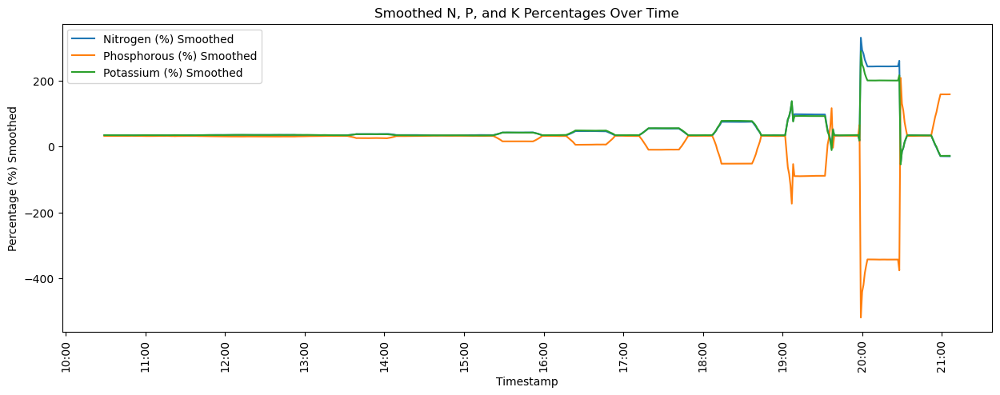

In [49]:
window_size = 30  # for example, a window of 10 data points
rack1_1['N_Percentage_Smooth'] = rack1_1['N_Percentage'].rolling(window=window_size).mean()
rack1_1['P_Percentage_Smooth'] = rack1_1['P_Percentage'].rolling(window=window_size).mean()
rack1_1['K_Percentage_Smooth'] = rack1_1['K_Percentage'].rolling(window=window_size).mean()

plt.figure(figsize=(15, 5))
plt.plot(rack1_1['Timestamp'], rack1_1['N_Percentage_Smooth'], label='Nitrogen (%) Smoothed')
plt.plot(rack1_1['Timestamp'], rack1_1['P_Percentage_Smooth'], label='Phosphorous (%) Smoothed')
plt.plot(rack1_1['Timestamp'], rack1_1['K_Percentage_Smooth'], label='Potassium (%) Smoothed')
plt.title('Smoothed N, P, and K Percentages Over Time')
plt.xlabel('Timestamp')
plt.ylabel('Percentage (%) Smoothed')
ax = plt.gca()  # Get current axes
ax.xaxis.set_major_locator(mdates.HourLocator(interval=1))  # Locate hours every hour
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))  # Show only hours and minutes
plt.legend()
plt.xticks(rotation=90)  # May need to rotate the x-axis labels to vertical if still too cluttered
plt.show()

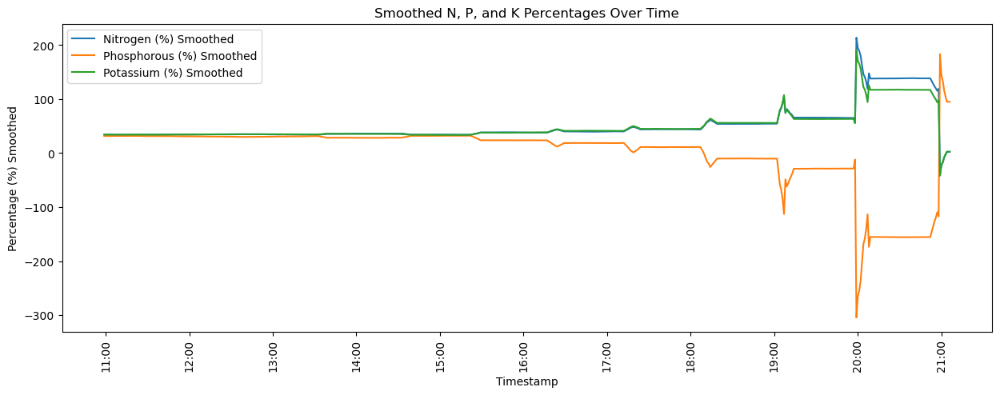

In [50]:
# Calculate rolling averages for a smoother plot
window_size = 60  # for example, a window of 10 data points
rack1_1['N_Percentage_Smooth'] = rack1_1['N_Percentage'].rolling(window=window_size).mean()
rack1_1['P_Percentage_Smooth'] = rack1_1['P_Percentage'].rolling(window=window_size).mean()
rack1_1['K_Percentage_Smooth'] = rack1_1['K_Percentage'].rolling(window=window_size).mean()

plt.figure(figsize=(15, 5))
plt.plot(rack1_1['Timestamp'], rack1_1['N_Percentage_Smooth'], label='Nitrogen (%) Smoothed')
plt.plot(rack1_1['Timestamp'], rack1_1['P_Percentage_Smooth'], label='Phosphorous (%) Smoothed')
plt.plot(rack1_1['Timestamp'], rack1_1['K_Percentage_Smooth'], label='Potassium (%) Smoothed')
plt.title('Smoothed N, P, and K Percentages Over Time')
plt.xlabel('Timestamp')
plt.ylabel('Percentage (%) Smoothed')
ax = plt.gca()  # Get current axes
ax.xaxis.set_major_locator(mdates.HourLocator(interval=1))  # Locate hours every hour
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))  # Show only hours and minutes
plt.legend()
plt.xticks(rotation=90)  # May need to rotate the x-axis labels to vertical if still too cluttered
plt.show()

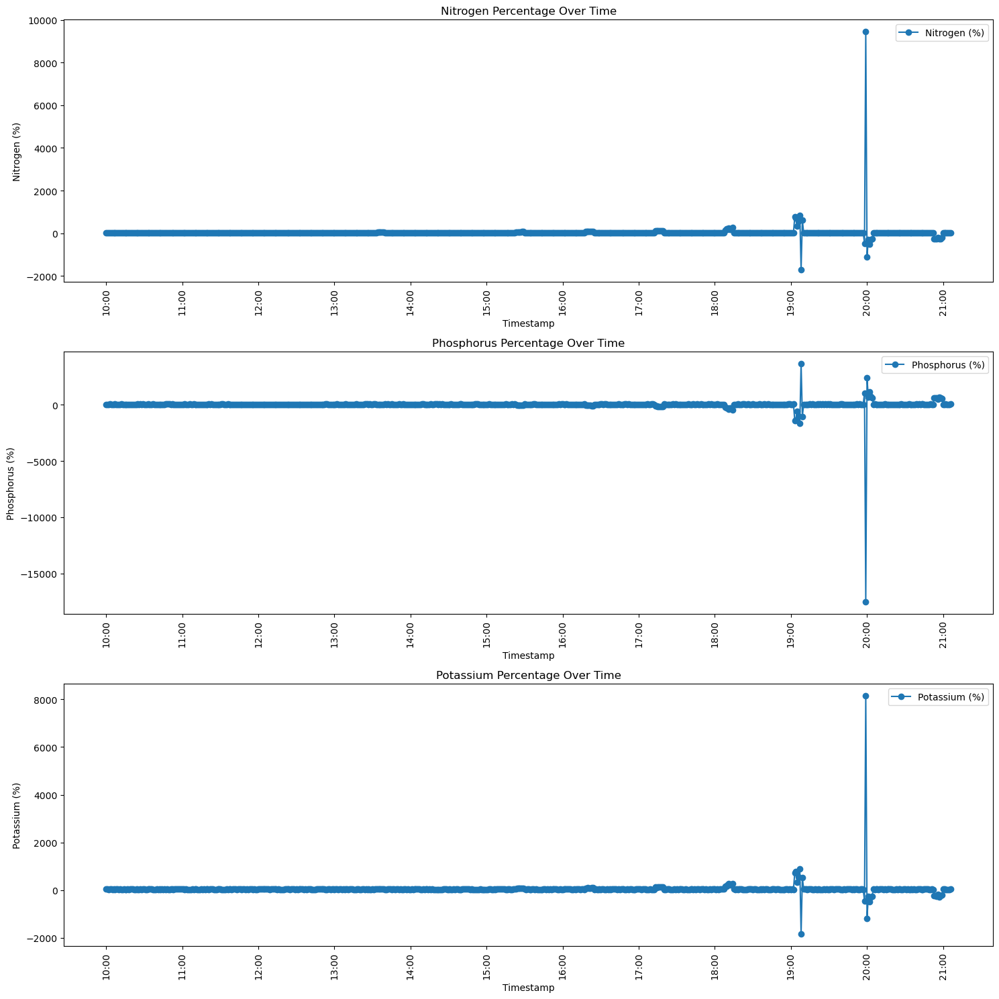

In [51]:
import matplotlib.pyplot as plt

# Define the size of the entire plotting area
plt.figure(figsize=(15, 15))

# Subplot for Nitrogen
plt.subplot(3, 1, 1)  # (number of rows, number of columns, subplot number)
plt.plot(rack1_1['Timestamp'], rack1_1['N_Percentage'], label='Nitrogen (%)', marker='o', linestyle='-')
plt.title('Nitrogen Percentage Over Time')
plt.xlabel('Timestamp')
plt.ylabel('Nitrogen (%)')
plt.xticks(rotation=90)
plt.legend()
ax = plt.gca()  # Get current axes
ax.xaxis.set_major_locator(mdates.HourLocator(interval=1))  # Locate hours every hour
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))  # Show only hours and minutes
# Subplot for Phosphorus
plt.subplot(3, 1, 2)
plt.plot(rack1_1['Timestamp'], rack1_1['P_Percentage'], label='Phosphorus (%)', marker='o', linestyle='-')
plt.title('Phosphorus Percentage Over Time')
plt.xlabel('Timestamp')
plt.ylabel('Phosphorus (%)')
plt.xticks(rotation=90)
plt.legend()
ax = plt.gca()  # Get current axes
ax.xaxis.set_major_locator(mdates.HourLocator(interval=1))  # Locate hours every hour
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))  # Show only hours and minutes
# Subplot for Potassium
plt.subplot(3, 1, 3)
plt.plot(rack1_1['Timestamp'], rack1_1['K_Percentage'], label='Potassium (%)', marker='o', linestyle='-')
plt.title('Potassium Percentage Over Time')
plt.xlabel('Timestamp')
plt.ylabel('Potassium (%)')
plt.xticks(rotation=90)
plt.legend()
ax = plt.gca()  # Get current axes
ax.xaxis.set_major_locator(mdates.HourLocator(interval=1))  # Locate hours every hour
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))  # Show only hours and minutes

# Adjust the layout so that all subplots fit into the figure area
plt.tight_layout()

# Show the plots
plt.show()


### 14/4/24

In [52]:
rack1_1 = pd.read_csv('./dscpdata/MacPherson_1_14_4_24.csv')

In [53]:
rack1_1.head()

,Timestamp,Number of Worms (non-counted),Phosphorous01,Phosphorous02,Nitrogen01,Nitrogen02,Potassium01,Potassium02,Light Intensity,Temp01,...,SoilM01,SoilM02,Grams of Compost Harvested,Buzzer,Unnamed: 16,Unnamed: 17,Unnamed: 18,Unnamed: 19,Unnamed: 20,Unnamed: 21
0,"5 Apr 2024, 10:00 AM",Approx 30 (15 worms added),146,169,173,141,169,160,NaN,27.4,...,1.0,1.0,NaN,Off,NaN,NaN,NaN,NaN,NaN,NaN
1,"5 Apr 2024, 10:01 AM",30,159,149,183,182,183,184,NaN,27.4,...,1.0,1.0,NaN,Off,NaN,NaN,NaN,NaN,NaN,NaN
2,"5 Apr 2024, 10:02 AM",NaN,132,147,150,181,136,175,NaN,27.4,...,1.0,1.0,NaN,Off,NaN,NaN,NaN,NaN,NaN,NaN
3,"5 Apr 2024, 10:03 AM",NaN,156,130,146,136,145,165,NaN,27.4,...,1.0,1.0,NaN,Off,NaN,NaN,NaN,NaN,NaN,NaN
4,"5 Apr 2024, 10:04 AM",NaN,171,153,143,131,133,138,NaN,27.4,...,1.0,1.0,NaN,Off,NaN,NaN,NaN,NaN,NaN,NaN


In [54]:
rack1_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 999 entries, 0 to 998
Data columns (total 22 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Timestamp                      999 non-null    object 
 1   Number of Worms (non-counted)  2 non-null      object 
 2   Phosphorous01                  998 non-null    object 
 3   Phosphorous02                  998 non-null    object 
 4   Nitrogen01                     998 non-null    object 
 5   Nitrogen02                     998 non-null    object 
 6   Potassium01                    998 non-null    object 
 7   Potassium02                    998 non-null    object 
 8   Light Intensity                0 non-null      float64
 9   Temp01                         774 non-null    float64
 10  Hum01                          774 non-null    float64
 11  Heat01                         774 non-null    float64
 12  SoilM01                        644 non-null    flo

In [55]:
rack1_1.describe()

,Light Intensity,Temp01,Hum01,Heat01,SoilM01,SoilM02,Grams of Compost Harvested,Unnamed: 16,Unnamed: 17,Unnamed: 18,Unnamed: 19,Unnamed: 20,Unnamed: 21
count,0.0,774.000000,774.000000,774.000000,644.000000,644.000000,142.0,142.0,142.0,142.0,142.0,142.0,142.0
mean,NaN,24.044832,68.639535,31.854005,0.551242,0.703416,0.0,0.0,0.0,0.0,0.0,0.0,0.0
std,NaN,13.426444,42.043045,18.492140,0.497754,0.457106,0.0,0.0,0.0,0.0,0.0,0.0,0.0
min,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25%,NaN,27.400000,0.000000,1.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
50%,NaN,31.700000,94.000000,42.000000,1.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
75%,NaN,32.400000,95.000000,43.000000,1.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
max,NaN,34.600000,100.000000,49.000000,1.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0


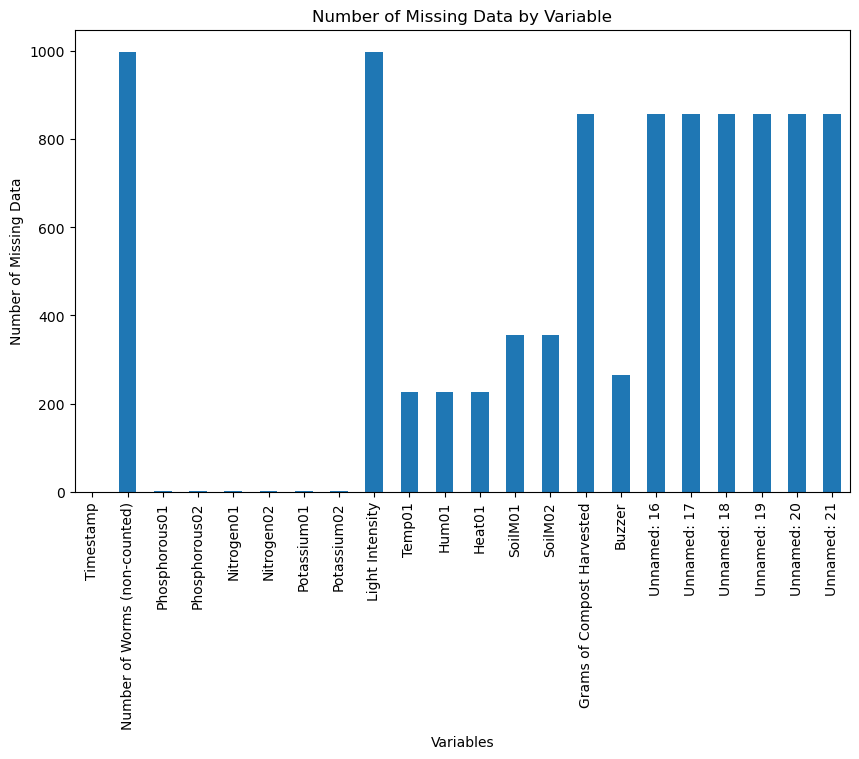

In [56]:
#Visualising missing data
color = []
missing_counts = rack1_1.isnull().sum()

plt.figure(figsize=(10, 6))  # Set the figure size

missing_counts.plot(kind='bar')


plt.title('Number of Missing Data by Variable')  # Set the title
plt.xlabel('Variables')  # Set the x-axis label
plt.ylabel('Number of Missing Data')  # Set the y-axis label

plt.show()

In [57]:
for column in ['Phosphorous01', 'Phosphorous02', 'Nitrogen01', 'Nitrogen02', 'Potassium01', 'Potassium02']:
    rack1_1[column] = pd.to_numeric(rack1_1[column], errors='coerce') 
    rack1_1[column] = rack1_1[column].fillna(0)  
    rack1_1[column] = rack1_1[column].astype(int)  

rack1_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 999 entries, 0 to 998
Data columns (total 22 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Timestamp                      999 non-null    object 
 1   Number of Worms (non-counted)  2 non-null      object 
 2   Phosphorous01                  999 non-null    int32  
 3   Phosphorous02                  999 non-null    int32  
 4   Nitrogen01                     999 non-null    int32  
 5   Nitrogen02                     999 non-null    int32  
 6   Potassium01                    999 non-null    int32  
 7   Potassium02                    999 non-null    int32  
 8   Light Intensity                0 non-null      float64
 9   Temp01                         774 non-null    float64
 10  Hum01                          774 non-null    float64
 11  Heat01                         774 non-null    float64
 12  SoilM01                        644 non-null    flo

In [58]:
rack1_1['Timestamp'] = pd.to_datetime(rack1_1['Timestamp'])
# rack1_1['Timestamp'] = rack1_1['Timestamp'].dt.strftime('%H:%M')
# rack1_1.head()

### Trend over time

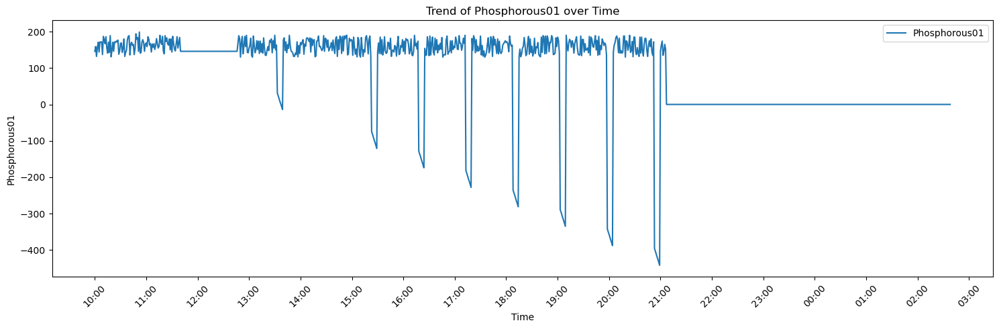

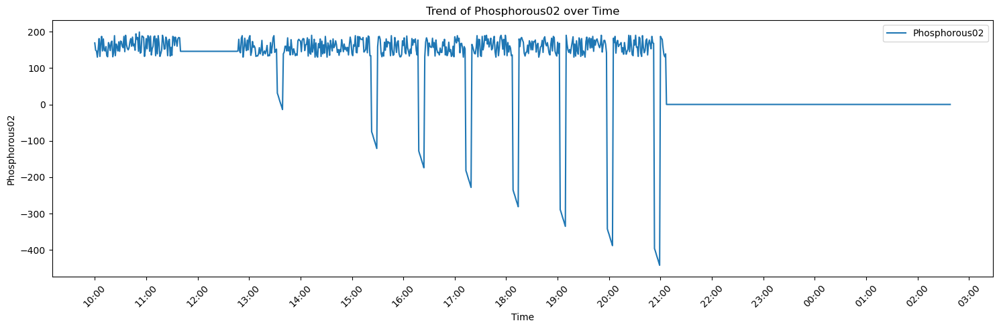

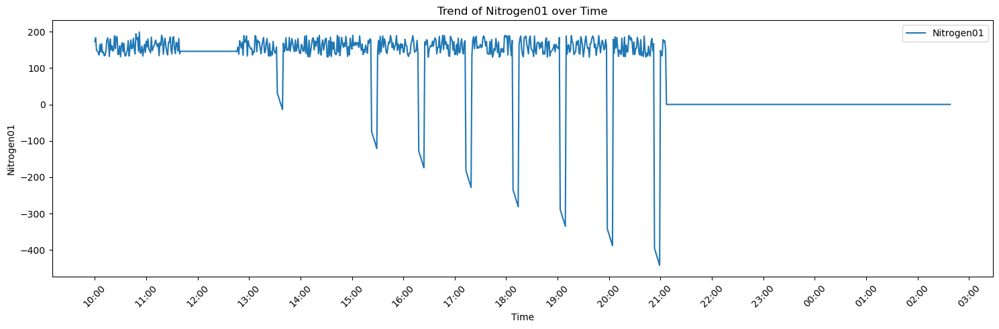

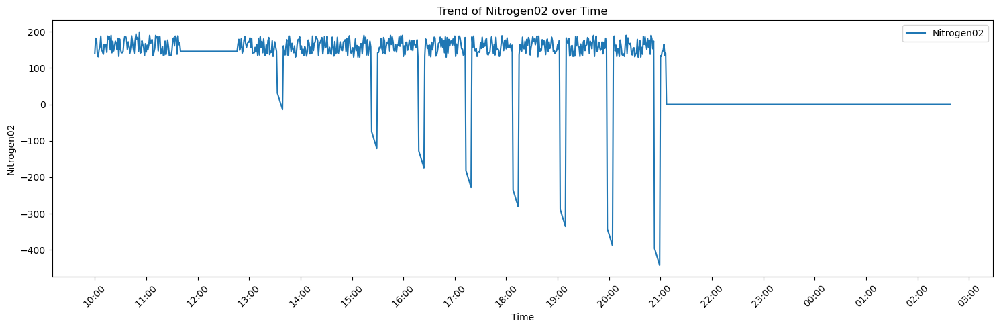

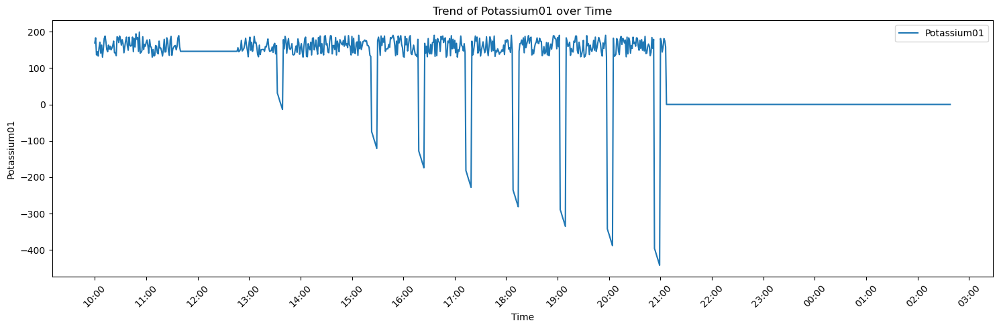

...

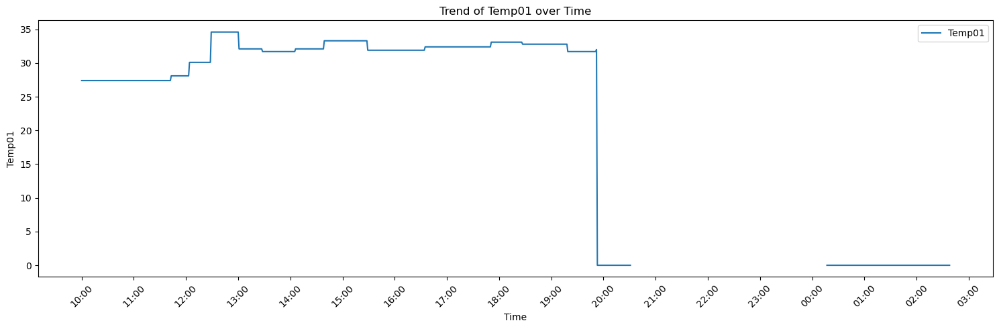

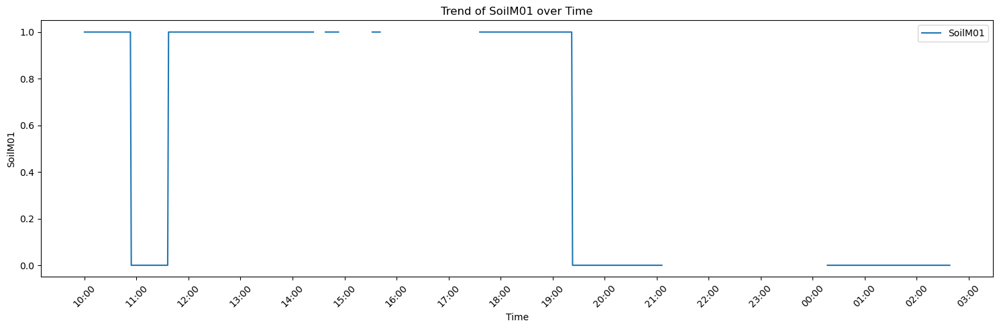

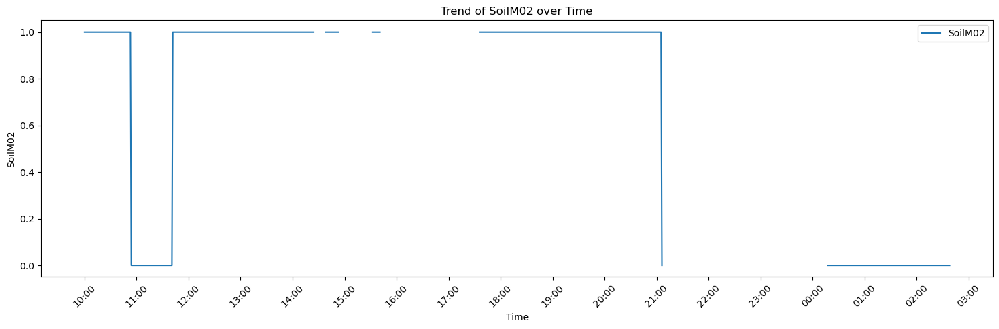

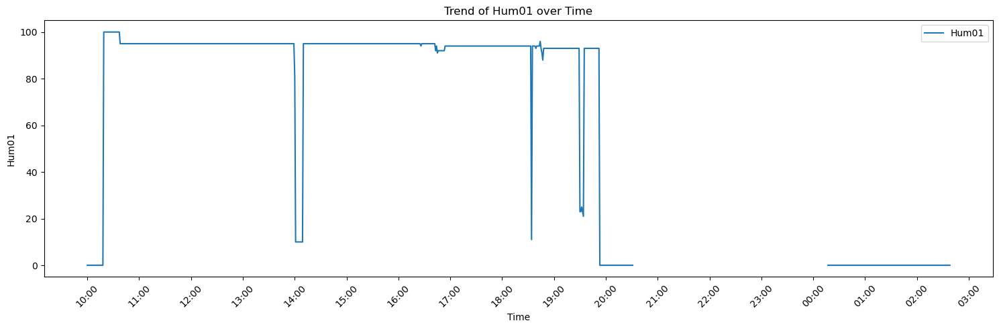

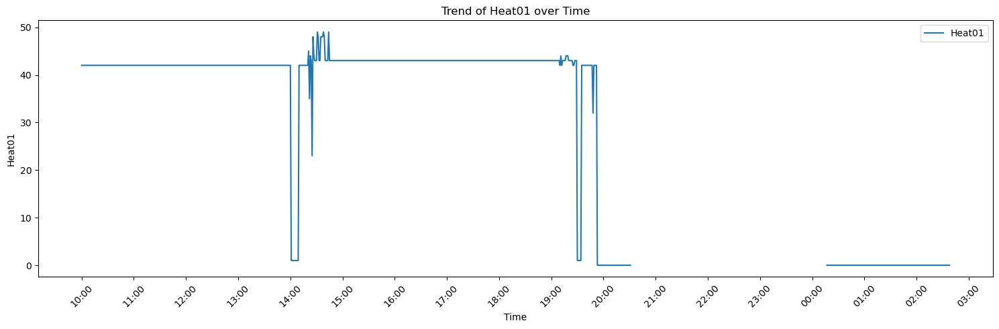

In [59]:
import matplotlib.dates as mdates

# Assuming 'Timestamp' is already converted to a datetime format in rack1_1 DataFrame

# Now, plot each variable over time
variables_to_plot = ['Phosphorous01', 'Phosphorous02', 'Nitrogen01', 'Nitrogen02', 
                     'Potassium01', 'Potassium02', 'Temp01', 'SoilM01', 'SoilM02',
                     'Hum01', 'Heat01']

for variable in variables_to_plot:
    plt.figure(figsize=(15, 5))
    plt.plot(rack1_1['Timestamp'], rack1_1[variable], label=variable)
    plt.title(f'Trend of {variable} over Time')
    plt.xlabel('Time')
    plt.ylabel(variable)

    # Configure x-axis with time formatting
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.HourLocator(interval=1))  # Locate hours every hour
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))  # Show only hours and minutes

    plt.xticks(rotation=45)  # Rotate for better readability
    plt.legend()
    plt.tight_layout()  # Adjust layout to fit everything
    plt.show()

### NPK ratio

In [60]:
# Ensure N, P, and K columns are numeric
rack1_1['Phosphorous01'] = pd.to_numeric(rack1_1['Phosphorous01'], errors='coerce')
rack1_1['Nitrogen01'] = pd.to_numeric(rack1_1['Nitrogen01'], errors='coerce')
rack1_1['Potassium01'] = pd.to_numeric(rack1_1['Potassium01'], errors='coerce')

# Calculate total NPK for each record
rack1_1['Total_NPK'] = rack1_1['Nitrogen01'] + rack1_1['Phosphorous01'] + rack1_1['Potassium01']

# Calculate the percentage of N, P, and K relative to the total
rack1_1['N_Percentage'] = (rack1_1['Nitrogen01'] / rack1_1['Total_NPK']) * 100
rack1_1['P_Percentage'] = (rack1_1['Phosphorous01'] / rack1_1['Total_NPK']) * 100
rack1_1['K_Percentage'] = (rack1_1['Potassium01'] / rack1_1['Total_NPK']) * 100

# Check the new variables
rack1_1[['N_Percentage', 'P_Percentage', 'K_Percentage']].head()

,N_Percentage,P_Percentage,K_Percentage
0,35.450820,29.918033,34.631148
1,34.857143,30.285714,34.857143
2,35.885167,31.578947,32.535885
3,32.662192,34.899329,32.438479
4,31.991051,38.255034,29.753915


In [61]:
# Calculate the mean for N, P, and K percentages
average_N_percentage = rack1_1['N_Percentage'].mean()
average_P_percentage = rack1_1['P_Percentage'].mean()
average_K_percentage = rack1_1['K_Percentage'].mean()

# Output the averages
average_N_percentage, average_P_percentage, average_K_percentage

(33.19258185478671, 33.395198187780515, 33.41221995743278)

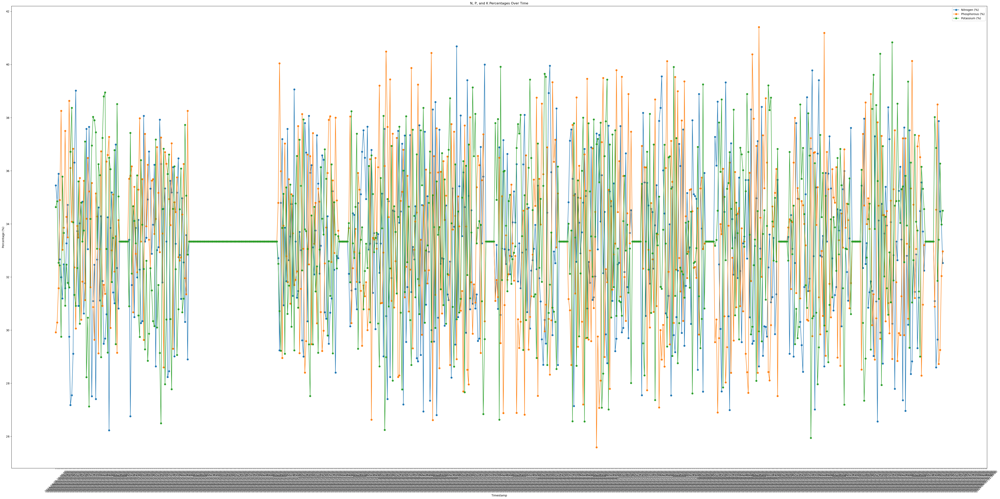

In [62]:
rack1_1['Timestamp'] = rack1_1['Timestamp'].astype(str).fillna('placeholder')

plt.figure(figsize=(50, 25))

# Plot each nutrient's percentage
plt.plot(rack1_1['Timestamp'], rack1_1['N_Percentage'], label='Nitrogen (%)', marker='o')
plt.plot(rack1_1['Timestamp'], rack1_1['P_Percentage'], label='Phosphorous (%)', marker='o')
plt.plot(rack1_1['Timestamp'], rack1_1['K_Percentage'], label='Potassium (%)', marker='o')

# Add labels and title
plt.title('N, P, and K Percentages Over Time')
plt.xlabel('Timestamp')
plt.ylabel('Percentage (%)')

# Rotate the x-axis labels to prevent overlap
plt.xticks(rotation=45)

# Add a legend to distinguish between lines
plt.legend()

# Adjust the layout
plt.tight_layout()

# Display the plot
plt.show()

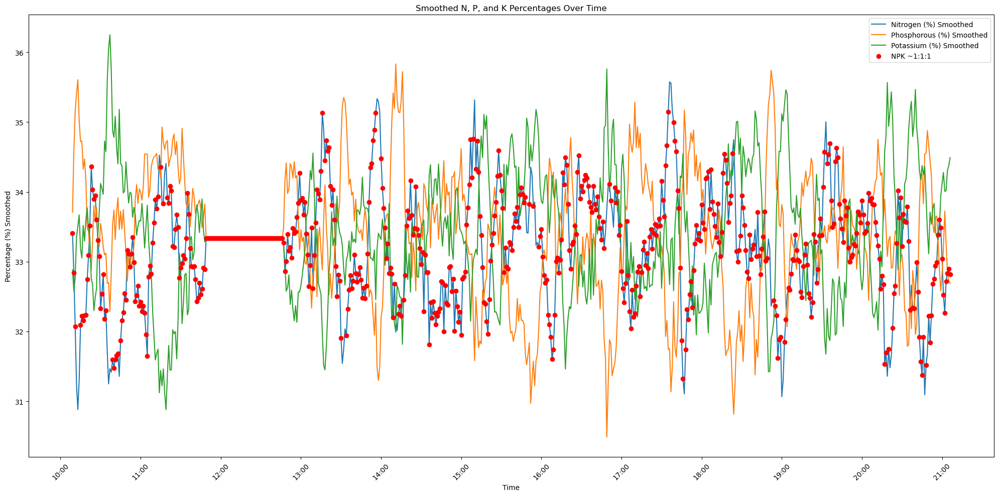

In [63]:
window_size = 10
rack1_1['N_Percentage_Smooth'] = rack1_1['N_Percentage'].rolling(window=window_size).mean()
rack1_1['P_Percentage_Smooth'] = rack1_1['P_Percentage'].rolling(window=window_size).mean()
rack1_1['K_Percentage_Smooth'] = rack1_1['K_Percentage'].rolling(window=window_size).mean()

# Calculate the difference from the 1:1:1 ratio
tolerance = 0.1  # 10% tolerance for equal ratio
rack1_1['NPK_Equal'] = (np.abs(rack1_1['N_Percentage_Smooth'] - rack1_1['P_Percentage_Smooth']) < tolerance * rack1_1['N_Percentage_Smooth']) & \
                       (np.abs(rack1_1['P_Percentage_Smooth'] - rack1_1['K_Percentage_Smooth']) < tolerance * rack1_1['P_Percentage_Smooth']) & \
                       (np.abs(rack1_1['K_Percentage_Smooth'] - rack1_1['N_Percentage_Smooth']) < tolerance * rack1_1['K_Percentage_Smooth'])

# Convert 'Timestamp' to datetime
rack1_1['Timestamp'] = pd.to_datetime(rack1_1['Timestamp'])

# Define the figure size
plt.figure(figsize=(20, 10))

# Plot the smoothed lines
plt.plot(rack1_1['Timestamp'], rack1_1['N_Percentage_Smooth'], label='Nitrogen (%) Smoothed')
plt.plot(rack1_1['Timestamp'], rack1_1['P_Percentage_Smooth'], label='Phosphorous (%) Smoothed')
plt.plot(rack1_1['Timestamp'], rack1_1['K_Percentage_Smooth'], label='Potassium (%) Smoothed')

# Highlight points where the NPK ratio is close to 1:1:1
equal_npk = rack1_1[rack1_1['NPK_Equal']]
plt.scatter(equal_npk['Timestamp'], equal_npk['N_Percentage_Smooth'], color='red', label='NPK ~1:1:1', zorder=5)

# Set the title and labels
plt.title('Smoothed N, P, and K Percentages Over Time')
plt.xlabel('Time')
plt.ylabel('Percentage (%) Smoothed')

# Configure x-axis with time formatting
ax = plt.gca()  # Get current axes
ax.xaxis.set_major_locator(mdates.HourLocator(interval=1))  # Locate hours every hour
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))  # Show only hours and minutes

plt.xticks(rotation=45)  # Rotate for better readability
plt.tight_layout()  # Adjust layout to fit everything
plt.legend()
plt.show()

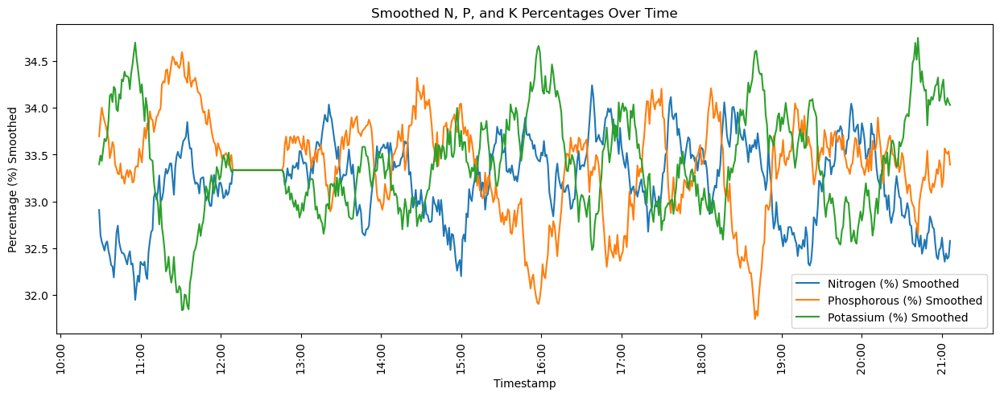

In [64]:
window_size = 30  # for example, a window of 10 data points
rack1_1['N_Percentage_Smooth'] = rack1_1['N_Percentage'].rolling(window=window_size).mean()
rack1_1['P_Percentage_Smooth'] = rack1_1['P_Percentage'].rolling(window=window_size).mean()
rack1_1['K_Percentage_Smooth'] = rack1_1['K_Percentage'].rolling(window=window_size).mean()

plt.figure(figsize=(15, 5))
plt.plot(rack1_1['Timestamp'], rack1_1['N_Percentage_Smooth'], label='Nitrogen (%) Smoothed')
plt.plot(rack1_1['Timestamp'], rack1_1['P_Percentage_Smooth'], label='Phosphorous (%) Smoothed')
plt.plot(rack1_1['Timestamp'], rack1_1['K_Percentage_Smooth'], label='Potassium (%) Smoothed')
plt.title('Smoothed N, P, and K Percentages Over Time')
plt.xlabel('Timestamp')
plt.ylabel('Percentage (%) Smoothed')
ax = plt.gca()  # Get current axes
ax.xaxis.set_major_locator(mdates.HourLocator(interval=1))  # Locate hours every hour
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))  # Show only hours and minutes
plt.legend()
plt.xticks(rotation=90)  # May need to rotate the x-axis labels to vertical if still too cluttered
plt.show()

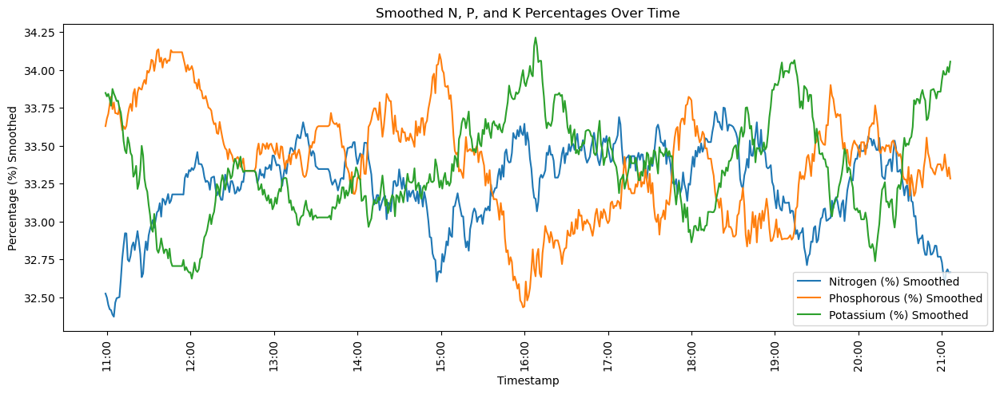

In [65]:
window_size = 60  # for example, a window of 10 data points
rack1_1['N_Percentage_Smooth'] = rack1_1['N_Percentage'].rolling(window=window_size).mean()
rack1_1['P_Percentage_Smooth'] = rack1_1['P_Percentage'].rolling(window=window_size).mean()
rack1_1['K_Percentage_Smooth'] = rack1_1['K_Percentage'].rolling(window=window_size).mean()

plt.figure(figsize=(15, 5))
plt.plot(rack1_1['Timestamp'], rack1_1['N_Percentage_Smooth'], label='Nitrogen (%) Smoothed')
plt.plot(rack1_1['Timestamp'], rack1_1['P_Percentage_Smooth'], label='Phosphorous (%) Smoothed')
plt.plot(rack1_1['Timestamp'], rack1_1['K_Percentage_Smooth'], label='Potassium (%) Smoothed')
plt.title('Smoothed N, P, and K Percentages Over Time')
plt.xlabel('Timestamp')
plt.ylabel('Percentage (%) Smoothed')
ax = plt.gca()  # Get current axes
ax.xaxis.set_major_locator(mdates.HourLocator(interval=1))  # Locate hours every hour
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))  # Show only hours and minutes
plt.legend()
plt.xticks(rotation=90)  # May need to rotate the x-axis labels to vertical if still too cluttered
plt.show()

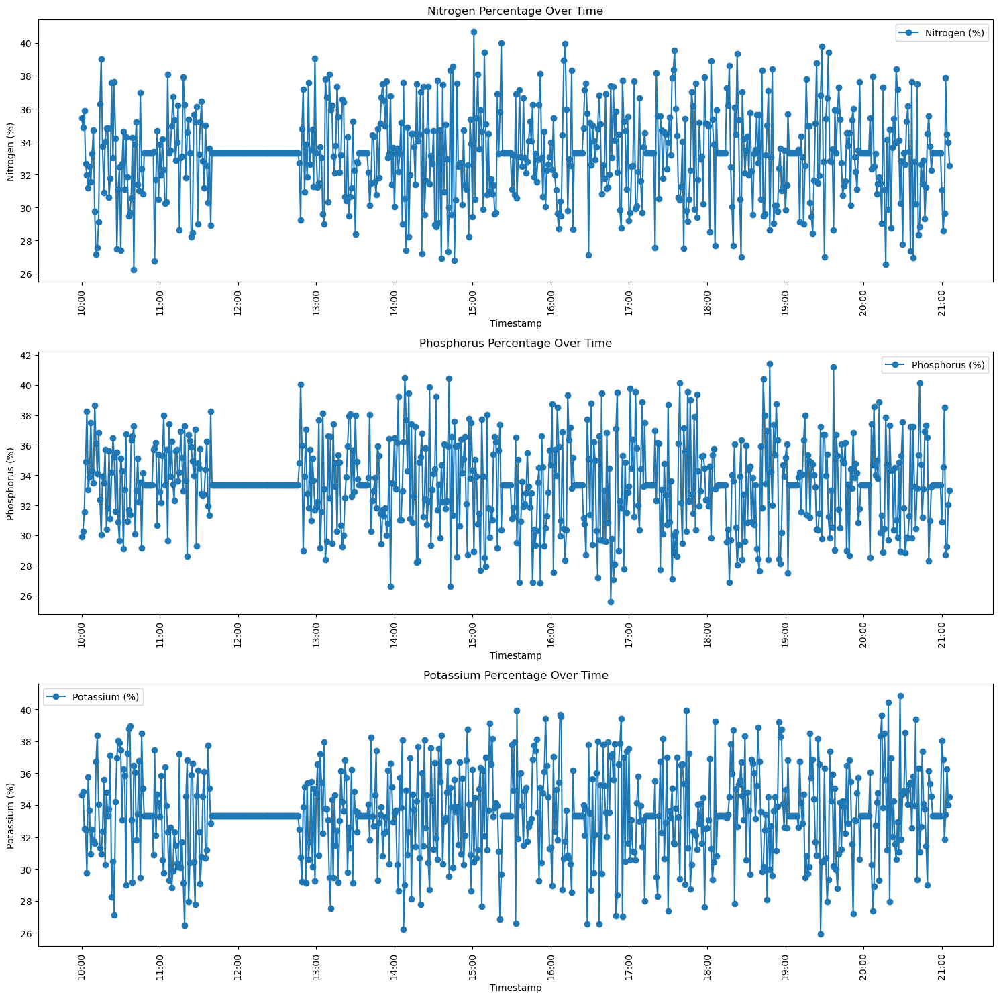

In [66]:
# Define the size of the entire plotting area
plt.figure(figsize=(15, 15))

# Subplot for Nitrogen
plt.subplot(3, 1, 1)  # (number of rows, number of columns, subplot number)
plt.plot(rack1_1['Timestamp'], rack1_1['N_Percentage'], label='Nitrogen (%)', marker='o', linestyle='-')
plt.title('Nitrogen Percentage Over Time')
plt.xlabel('Timestamp')
plt.ylabel('Nitrogen (%)')
plt.xticks(rotation=90)
plt.legend()
ax = plt.gca()  # Get current axes
ax.xaxis.set_major_locator(mdates.HourLocator(interval=1))  # Locate hours every hour
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))  # Show only hours and minutes
# Subplot for Phosphorus
plt.subplot(3, 1, 2)
plt.plot(rack1_1['Timestamp'], rack1_1['P_Percentage'], label='Phosphorus (%)', marker='o', linestyle='-')
plt.title('Phosphorus Percentage Over Time')
plt.xlabel('Timestamp')
plt.ylabel('Phosphorus (%)')
plt.xticks(rotation=90)
plt.legend()
ax = plt.gca()  # Get current axes
ax.xaxis.set_major_locator(mdates.HourLocator(interval=1))  # Locate hours every hour
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))  # Show only hours and minutes
# Subplot for Potassium
plt.subplot(3, 1, 3)
plt.plot(rack1_1['Timestamp'], rack1_1['K_Percentage'], label='Potassium (%)', marker='o', linestyle='-')
plt.title('Potassium Percentage Over Time')
plt.xlabel('Timestamp')
plt.ylabel('Potassium (%)')
plt.xticks(rotation=90)
plt.legend()
ax = plt.gca()  # Get current axes
ax.xaxis.set_major_locator(mdates.HourLocator(interval=1))  # Locate hours every hour
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))  # Show only hours and minutes

# Adjust the layout so that all subplots fit into the figure area
plt.tight_layout()

# Show the plots
plt.show()
